# Checking results from Magphys SED fitting on sources from EN1 field

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from time import time, localtime, strftime
from mpl_toolkits.axes_grid1 import make_axes_locatable
from astropy.io import fits
from astropy.visualization import ZScaleInterval

In [2]:
### For ELAIS-N1 ###
field = 'EN1'
catalogue_file = 'en1_match_final.csv'
magphys_file = 'en1_magphys.csv'
map_lofar_file = 'en1_radio_image.fits'
rms_lofar_file = 'en1_radio_rms_image.fits'

In [3]:
#path = "/home/bruno/Documents/ESO/Data/"+field+"/"
path = "C:\\Users\\bruno\\Documents\\Documents\\ESO\\Data\\"+field+"\\"

## Opening file and reading data onto a dataframe

### The following table includes galaxies already selected as having good quality data, and cross-matched with the radio catalog from LoTSS Deep Fields DR1

In [4]:
# Selecting columns to read:
columns = ['ID_1','RA_1','DEC_1','Z_BEST_1','z','Mass_median_2','K_flux','AGN_1','ch1_swire_flux','ch2_swire_flux','ch3_swire_flux','ch4_swire_flux','NUV_rest','r_rest_2','J_rest_2','Peak_flux','Total_flux','S_Code']
start_time1 = time()
# Reading the data:
table = pd.read_csv(path+'Catalogues/'+catalogue_file,usecols=columns)
end_time1 = time()
print(f"Creating dataframe took {end_time1-start_time1:.4g} seconds!")
table['S_Code'] = table['S_Code'].astype("category")
table.info()
print(f"Number of galaxies in catalogue: {len(table)}")

Creating dataframe took 8.03 seconds!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 559344 entries, 0 to 559343
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   ID_1            559344 non-null  int64   
 1   RA_1            559344 non-null  float64 
 2   DEC_1           559344 non-null  float64 
 3   K_flux          559344 non-null  float64 
 4   ch1_swire_flux  559344 non-null  float64 
 5   ch2_swire_flux  559344 non-null  float64 
 6   ch3_swire_flux  559344 non-null  float64 
 7   ch4_swire_flux  559344 non-null  float64 
 8   Z_BEST_1        559344 non-null  float64 
 9   AGN_1           559344 non-null  int64   
 10  z               559344 non-null  float64 
 11  Mass_median_2   554623 non-null  float64 
 12  r_rest_2        558873 non-null  float64 
 13  J_rest_2        558873 non-null  float64 
 14  NUV_rest        558873 non-null  float64 
 15  Total_flux      19590 non-null   float64 
 16  

In [5]:
table.index = list(table['ID_1'])

## Getting rid of luminous AGN
We will discard entries of the catalog wich are likely to be luminous AGN and could thus be contaminating our sample. We will select them based on wether they are marked as AGN, or if they meet the IR AGN criteria presented by Donley et al. (2012).

In [6]:
print(f"Entries flagged as optical, IR or X-ray AGN: {np.count_nonzero(table['AGN_1'])}")
table['x'] = np.log10(table['ch3_swire_flux']/table['ch1_swire_flux'])
table['y'] = np.log10(table['ch4_swire_flux']/table['ch2_swire_flux'])
Donley = '(x>=0.08)&(y>=0.15)&(y>=(1.21*x)-0.27)&(y<=(1.21*x)+0.27)&(ch4_swire_flux>ch3_swire_flux>ch2_swire_flux>ch1_swire_flux)'
print(f"Entries that meet the Donley et al. (2012) IR AGN criteria: {len(table.query(Donley))}")

Entries flagged as optical, IR or X-ray AGN: 1281
Entries that meet the Donley et al. (2012) IR AGN criteria: 4535


C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [7]:
print(f"Total entries to be excluded for containing bright AGN: {len(table.query(Donley+'|(AGN_1==1)'))}")

Total entries to be excluded for containing bright AGN: 4921


In [8]:
table = table.query('~('+Donley+')')

In [9]:
table = table[table['AGN_1']==0]
print(f"Number of galaxies in sample: {len(table)}")

Number of galaxies in sample: 554423


## Including results from MagPhys SED fitting

In [10]:
# Selecting columns to read:
columns = ['galaxy_id','Mstar_best','Mstar_50','SFR_best','SFR_50','chi2_99_flag']
start_time1 = time()
# Reading the data:
magphys = pd.read_csv(path+'Catalogues/'+magphys_file,usecols=columns)
end_time1 = time()
print(f"Creating dataframe took {end_time1-start_time1:.4g} seconds!")
magphys.info()
print(f"Number of galaxies in catalogue: {len(magphys)}")

Creating dataframe took 0.998 seconds!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183399 entries, 0 to 183398
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   galaxy_id     183399 non-null  int64  
 1   chi2_99_flag  183399 non-null  int64  
 2   Mstar_best    183399 non-null  float64
 3   Mstar_50      183399 non-null  float64
 4   SFR_best      183399 non-null  float64
 5   SFR_50        183399 non-null  float64
dtypes: float64(4), int64(2)
memory usage: 8.4 MB
Number of galaxies in catalogue: 183399


In [11]:
magphys.index = list(magphys['galaxy_id'])
table = pd.concat([table,magphys],axis=1)

del magphys

In [12]:
table.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 556655 entries, 984935 to 613227
Data columns (total 26 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   ID_1            554423 non-null  float64 
 1   RA_1            554423 non-null  float64 
 2   DEC_1           554423 non-null  float64 
 3   K_flux          554423 non-null  float64 
 4   ch1_swire_flux  554423 non-null  float64 
 5   ch2_swire_flux  554423 non-null  float64 
 6   ch3_swire_flux  554423 non-null  float64 
 7   ch4_swire_flux  554423 non-null  float64 
 8   Z_BEST_1        554423 non-null  float64 
 9   AGN_1           554423 non-null  float64 
 10  z               554423 non-null  float64 
 11  Mass_median_2   550058 non-null  float64 
 12  r_rest_2        553952 non-null  float64 
 13  J_rest_2        553952 non-null  float64 
 14  NUV_rest        553952 non-null  float64 
 15  Total_flux      18998 non-null   float64 
 16  Peak_flux       18998 non-null   

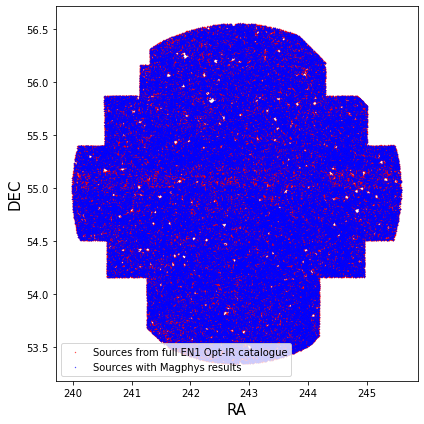

In [12]:
fig,ax = plt.subplots(figsize=(6,6))
ax.set_xlabel('RA',size=15)
ax.set_ylabel('DEC',size=15)
ax.scatter(table['RA_1'],table['DEC_1'],s=0.1,color='r',label='Sources from full '+field+' Opt-IR catalogue')
ax.scatter(table.loc[np.isfinite(table['SFR_50']),'RA_1'],table.loc[np.isfinite(table['SFR_50']),'DEC_1'],s=0.1,color='b',label='Sources with Magphys results')
ax.legend(numpoints=1,loc='best')
fig.tight_layout()
plt.show()

## Redshift and stellar mass distribution

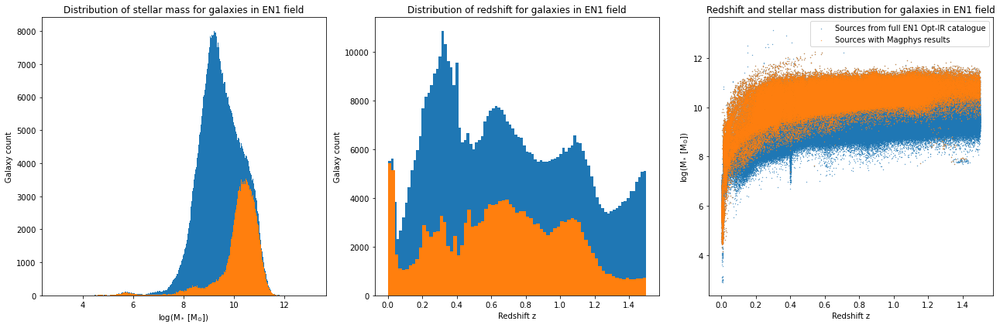

In [12]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
# Plotting stellar mass histogram
ax[0].set_title('Distribution of stellar mass for galaxies in '+field+' field')
ax[0].set_xlabel('log(M$_*$ [M$_{\odot}$])')
ax[0].set_ylabel('Galaxy count')
ax[0].hist(table['Mass_median_2'], 'auto')
ax[0].hist(table.loc[np.isfinite(table['SFR_50']),'Mass_median_2'], 'auto')
# Plotting redshift histogram
ax[1].set_title('Distribution of redshift for galaxies in '+field+' field')
ax[1].set_xlabel('Redshift z')
ax[1].set_ylabel('Galaxy count')
ax[1].hist(table['z'], 'auto')
ax[1].hist(table.loc[np.isfinite(table['SFR_50']),'z'], 'auto')
# Plotting Stellar mass vs Redshift
ax[2].set_title('Redshift and stellar mass distribution for galaxies in '+field+' field')
ax[2].set_xlabel("Redshift z",fontsize=10)
ax[2].set_ylabel("log(M$_*$ [M$_{\odot}$])",fontsize=10)
ax[2].scatter(table['z'],table['Mass_median_2'],s=0.1,label='Sources from full '+field+' Opt-IR catalogue')
ax[2].scatter(table.loc[np.isfinite(table['SFR_50']),'z'],table.loc[np.isfinite(table['SFR_50']),'Mass_median_2'],s=0.1,label='Sources with Magphys results')
ax[2].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


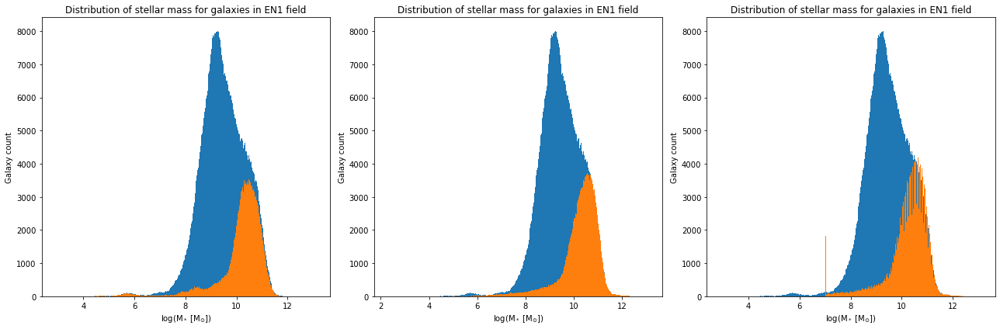

In [31]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
# Plotting stellar mass histogram
ax[0].set_title('Distribution of stellar mass for galaxies in '+field+' field')
ax[0].set_xlabel('log(M$_*$ [M$_{\odot}$]) (K. Duncan)')
ax[0].set_ylabel('Galaxy count')
ax[0].hist(table['Mass_median_2'], 'auto')
ax[0].hist(table.loc[np.isfinite(table['SFR_50']),'Mass_median_2'], 'auto')
# Plotting redshift histogram
ax[1].set_title('Distribution of stellar mass for galaxies in '+field+' field')
ax[1].set_xlabel('log(M$_*$ [M$_{\odot}$]) (Magphys best)')
ax[1].set_ylabel('Galaxy count')
ax[1].hist(table['Mass_median_2'], 'auto')
ax[1].hist(np.log10(table.loc[np.isfinite(table['SFR_50']),'Mstar_best']), 'auto')
# Plotting Stellar mass vs Redshift
ax[2].set_title('Distribution of stellar mass for galaxies in '+field+' field')
ax[2].set_xlabel('log(M$_*$ [M$_{\odot}$]) (Magphys median)')
ax[2].set_ylabel('Galaxy count')
ax[2].hist(table['Mass_median_2'], 'auto')
ax[2].hist(np.log10(table.loc[np.isfinite(table['SFR_50']),'Mstar_50']), 'auto')
fig.tight_layout()
plt.show()

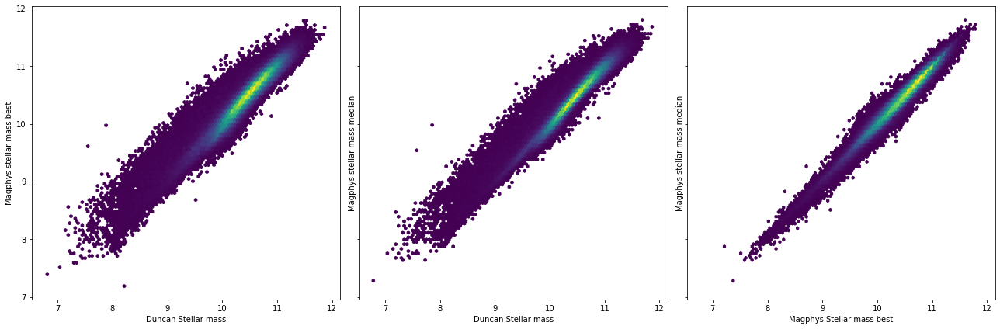

In [30]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharex='all',sharey='all')
# Plotting stellar mass histogram
ax[0].hexbin(table['Mass_median_2'],np.log10(table['Mstar_best']),mincnt=1)
ax[0].set_xlabel('Duncan Stellar mass')
ax[0].set_ylabel('Magphys stellar mass best')
# Plotting redshift histogram
ax[1].hexbin(table['Mass_median_2'],np.log10(table['Mstar_50']),mincnt=1)
ax[1].set_xlabel('Duncan Stellar mass')
ax[1].set_ylabel('Magphys stellar mass median')
# Plotting Stellar mass vs Redshift
ax[2].hexbin(np.log10(table['Mstar_best']),np.log10(table['Mstar_50']),mincnt=1)
ax[2].set_xlabel('Magphys Stellar mass best')
ax[2].set_ylabel('Magphys stellar mass median')
fig.tight_layout()
plt.show()

In [12]:
table = table[np.isfinite(table['SFR_50'])]
table = table[np.isfinite(table['ID_1'])]
len(table)

181167

In [13]:
table = table[table['Z_BEST_1']<1.5]
table = table[table['Z_BEST_1']>0.05]
len(table)

169623

In [14]:
table = table[table['chi2_99_flag']==0]
len(table)

161165

In [15]:
table = table[table['Mass_median_2']<11.5]
table = table[table['Mass_median_2']>8.]
len(table)

160625

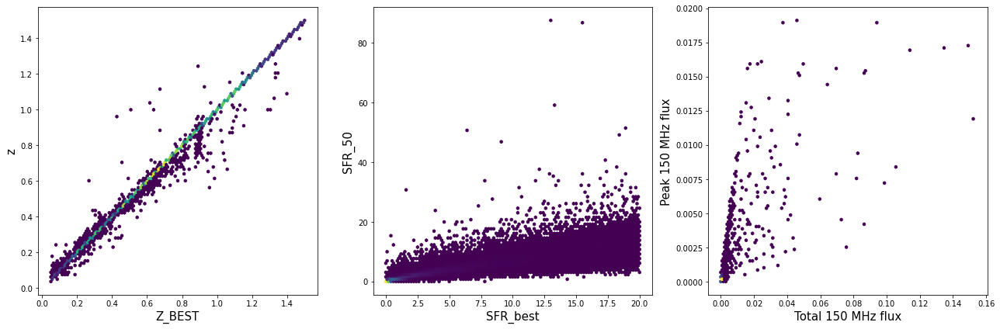

In [16]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
ax[0].hexbin(table['Z_BEST_1'],table['z'],mincnt=1)
ax[0].set_xlabel('Z_BEST',size=15)
ax[0].set_ylabel('z',size=15)
ax[1].hexbin(table.loc[table['SFR_best']<20,'SFR_best'],table.loc[table['SFR_best']<20,'SFR_50'],mincnt=1)
ax[1].set_xlabel('SFR_best',size=15)
ax[1].set_ylabel('SFR_50',size=15)
ax[2].hexbin(table.loc[table['Peak_flux']<0.02,'Total_flux'],table.loc[table['Peak_flux']<0.02,'Peak_flux'],mincnt=1)
ax[2].set_xlabel('Total 150 MHz flux',size=15)
ax[2].set_ylabel('Peak 150 MHz flux',size=15)
fig.tight_layout()
plt.show()

In [16]:
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
import astropy.units as u

## Opening LOFAR map for selected field

In [17]:
### DON'T SKIP ###
from astropy.io import fits
from astropy.nddata import Cutout2D
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy import wcs
#from astropy.wcs.utils import pixel_to_skycoord

In [18]:
# Opening LOFAR map
hdulist = fits.open(path+'Maps/'+map_lofar_file,memmap=True)
w_lofar = wcs.WCS(hdulist[0].header,naxis=2) # TAKE ONLY THE FIRST 2 DIMENSIONS (RA,DEC)

#hdulist[0].header

In [19]:
# Opening LOFAR RMS map
hdulist1 = fits.open(path+'Maps/'+rms_lofar_file,memmap=True)
w_lofar1 = wcs.WCS(hdulist[0].header,naxis=2) # TAKE ONLY THE FIRST 2 DIMENSIONS (RA,DEC)

#hdulist1[0].header

In [20]:
print(w_lofar)
unit_lofar = hdulist[0].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_lofar)
pixscale_lofar = hdulist[0].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_lofar," arcseconds")
imdata_lofar = hdulist[0].data[0][0] # TAKING ONLY THE FIRST 2 DIMENSIONS (RA,DEC)
rmsdata_lofar = hdulist1[0].data[0][0] # TAKING ONLY THE FIRST 2 DIMENSIONS (RA,DEC)
hdulist.close()
hdulist1.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---SIN'  'DEC--SIN'  
CRVAL : 242.75  55.0  
CRPIX : 7001.0  7001.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : -0.00041666666666667  0.00041666666666667  
NAXIS : 14000  14000  1  1
Map unit :  Jy/beam
Pixel scale :  1.500000000000012  arcseconds


In [23]:
imdata_lofar.shape

(14000, 14000)

In [24]:
fwhm_lofar = 6.0

In [20]:
def get_pix_value(ra,dec,image,wcs):
        world_coords = [ra,dec]                                 # world coordinates
        pixel_coords = wcs.all_world2pix([world_coords], 0) # pixel coordinates
        position = (pixel_coords[0][0],pixel_coords[0][1])      # position to create cutout
        size = (1,1)                                            # cutout size in pixels
        #print(position)
        cutout = Cutout2D(image, position, size, mode='partial')
        
        return cutout.data[0][0]

In [21]:
def get_pix_value(ra,dec,flux_image,rms_image,flux_wcs,rms_wcs):
        world_coords = [ra,dec]                                 # world coordinates
        pixel_coords = flux_wcs.all_world2pix([world_coords], 0) # pixel coordinates
        position = (pixel_coords[0][0],pixel_coords[0][1])      # position to create cutout
        size = (3,3)                                            # cutout size in pixels
        flux_arr = Cutout2D(flux_image, position, size, mode='partial').data
        
        pixel_coords = rms_wcs.all_world2pix([world_coords], 0) # pixel coordinates
        position = (pixel_coords[0][0],pixel_coords[0][1])      # position to create cutout
        size = (3,3)                                            # cutout size in pixels
        rms_arr = Cutout2D(rms_image, position, size, mode='partial').data
        
        flux = flux_arr.max()
        rms = rms_arr[flux_arr==flux][0]
        
        return flux, rms

In [22]:
table['pix_flux'],table['pix_rms'] = np.array([get_pix_value(ra,dec,imdata_lofar,rmsdata_lofar,w_lofar,w_lofar1) for ra,dec in zip(table.loc[:,'RA_1'],table.loc[:,'DEC_1'])]).transpose()

In [21]:
#table['pix_flux'] = [get_pix_value(ra,dec,imdata_lofar,w_lofar) for ra,dec in zip(table.loc[:,'RA_1'],table.loc[:,'DEC_1'])]

In [22]:
#table['pix_rms'] = [get_pix_value(ra,dec,rmsdata_lofar,w_lofar1) for ra,dec in zip(table.loc[:,'RA_1'],table.loc[:,'DEC_1'])]

In [23]:
table['pix_StN'] = table['pix_flux']/table['pix_rms']

## Pixel flux and RMS distribution

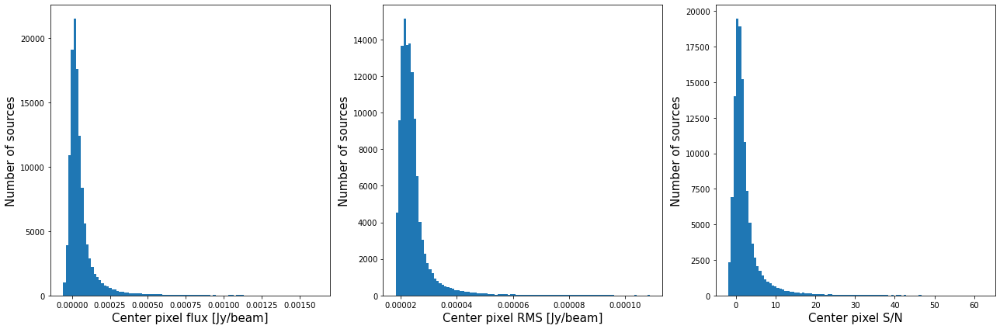

In [48]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
ax[0].hist(table.loc[(table['pix_flux']>np.percentile(table['pix_flux'],0.5))&(table['pix_flux']<np.percentile(table['pix_flux'],99.5)),'pix_flux'],bins=100)
ax[0].set_xlabel('Center pixel flux [Jy/beam]',size=15)
ax[0].set_ylabel('Number of sources',size=15)
ax[1].hist(table.loc[(table['pix_rms']>np.percentile(table['pix_rms'],0.5))&(table['pix_rms']<np.percentile(table['pix_rms'],99.5)),'pix_rms'],bins=100)
ax[1].set_xlabel('Center pixel RMS [Jy/beam]',size=15)
ax[1].set_ylabel('Number of sources',size=15)
ax[2].hist(table.loc[(table['pix_StN']>np.percentile(table['pix_StN'],0.5))&(table['pix_StN']<np.percentile(table['pix_StN'],99.5)),'pix_StN'],bins=100)
ax[2].set_xlabel('Center pixel S/N',size=15)
ax[2].set_ylabel('Number of sources',size=15)
fig.tight_layout()
plt.show()

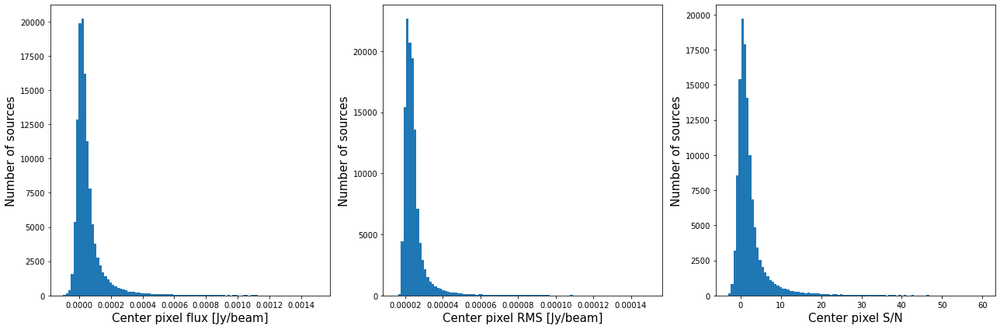

In [34]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
ax[0].hist(table['pix_flux'],bins=np.linspace(-0.0001,0.0015,100))
ax[0].set_xlabel('Center pixel flux [Jy/beam]',size=15)
ax[0].set_ylabel('Number of sources',size=15)
ax[1].hist(table['pix_rms'],bins=np.linspace(0.000015,0.00015,100))
ax[1].set_xlabel('Center pixel RMS [Jy/beam]',size=15)
ax[1].set_ylabel('Number of sources',size=15)
ax[2].hist(table['pix_StN'],bins=np.linspace(-3,60,101))
ax[2].set_xlabel('Center pixel S/N',size=15)
ax[2].set_ylabel('Number of sources',size=15)
fig.tight_layout()
plt.show()

In [23]:
limits_world = [[min(table['RA_1']),min(table['DEC_1'])],
                [min(table['RA_1']),max(table['DEC_1'])],
                [max(table['RA_1']),max(table['DEC_1'])],
                [max(table['RA_1']),min(table['DEC_1'])],
                [min(table['RA_1']),min(table['DEC_1'])]]
limits_pixel = w_lofar.all_world2pix(limits_world, 0).transpose()
limits_pixel

array([[10951.93755275, 10648.88033622,  3258.37276636,  2947.61246999,
        10951.93755275],
       [ 3115.13934922, 10798.33735636, 10802.04593376,  3119.15594197,
         3115.13934922]])

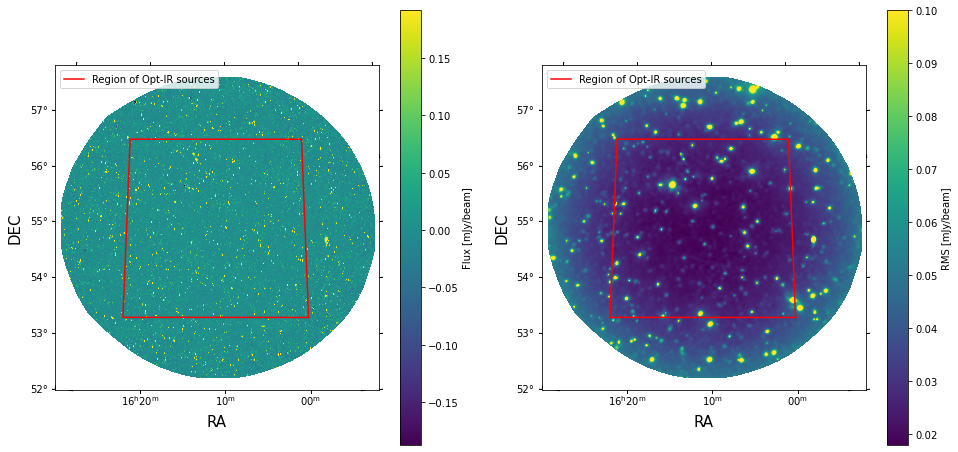

In [25]:
fig, ax = plt.subplots(1,2,figsize=(16,8),subplot_kw=dict(projection=w_lofar))
vis = ZScaleInterval(nsamples=1000, contrast=0.25, max_reject=0.5, min_npixels=5, krej=2.5, max_iterations=5)
vmin,vmax = vis.get_limits(imdata_lofar*1000)
image = ax[0].imshow(imdata_lofar*1000,vmin=vmin,vmax=vmax,origin='lower')
cb = fig.colorbar(image,ax=ax[0],label=f'Flux [m{unit_lofar}]')
ax[0].plot(limits_pixel[0],limits_pixel[1],c='r',label='Region of Opt-IR sources')
ax[0].set_xlabel('RA',size=15)
ax[0].set_ylabel('DEC',size=15)
ax[0].legend(loc='upper left')
vmin,vmax = vis.get_limits(rmsdata_lofar*1000)
image = ax[1].imshow(rmsdata_lofar*1000,vmin=vmin,vmax=vmax,origin='lower')
cb = fig.colorbar(image,ax=ax[1],label=f'RMS [m{unit_lofar}]')
ax[1].plot(limits_pixel[0],limits_pixel[1],c='r',label='Region of Opt-IR sources')
ax[1].set_xlabel('RA',size=15)
ax[1].set_ylabel('DEC',size=15)
ax[1].legend(loc='upper left')
plt.show()

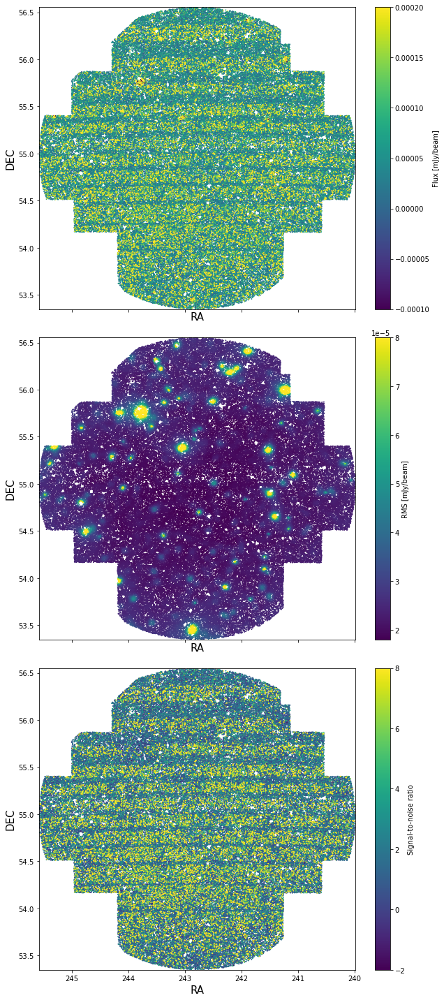

In [22]:
fig,ax = plt.subplots(3,1,figsize=(9,20),sharex='all',sharey='all')
#norm = plt.Normalize(np.percentile(table['pix_flux'],1),np.percentile(table['pix_flux'],99))
norm = plt.Normalize(-0.0001,0.0002)
points = ax[0].scatter(table['RA_1'],table['DEC_1'],s=0.8,c=table['pix_flux'],norm=norm)
fig.colorbar(points, ax = ax[0],label=f'Flux [m{unit_lofar}]')
ax[0].set_xlabel('RA',size=15)
ax[0].set_ylabel('DEC',size=15)

#norm = plt.Normalize(np.percentile(table['pix_rms'],1),np.percentile(table['pix_rms'],99))
norm = plt.Normalize(0.000018,0.00008)
points = ax[1].scatter(table['RA_1'],table['DEC_1'],s=0.8,c=table['pix_rms'],norm=norm)
fig.colorbar(points, ax = ax[1],label=f'RMS [m{unit_lofar}]')
ax[1].set_xlabel('RA',size=15)
ax[1].set_ylabel('DEC',size=15)

#norm = plt.Normalize(np.percentile(table['pix_StN'],1),np.percentile(table['pix_StN'],99))
norm = plt.Normalize(-2,8)
points = ax[2].scatter(table['RA_1'],table['DEC_1'],s=0.8,c=table['pix_StN'],norm=norm)
fig.colorbar(points, ax = ax[2],label=f'Signal-to-noise ratio')
ax[2].set_xlabel('RA',size=15)
ax[2].set_ylabel('DEC',size=15)
ax[2].set_xlim(max(table['RA_1']),min(table['RA_1']))
ax[2].set_ylim(min(table['DEC_1']),max(table['DEC_1']))
fig.tight_layout()
plt.show()

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


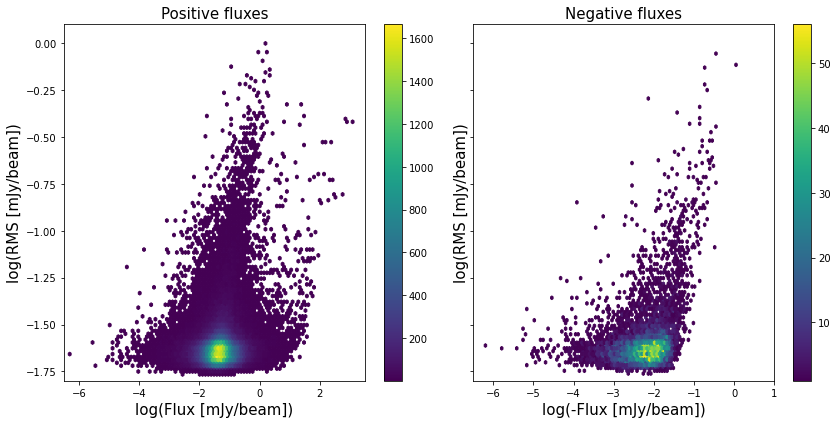

In [30]:
fig, ax = plt.subplots(1,2,figsize=(12,6),sharey='all')
hb = ax[0].hexbin(np.log10(table['pix_flux']*1000),np.log10(table['pix_rms']*1000),mincnt=1)
fig.colorbar(hb,ax = ax[0])
ax[0].set_xlabel('log(Flux [mJy/beam])',size=15)
ax[0].set_ylabel('log(RMS [mJy/beam])',size=15)
ax[0].set_title('Positive fluxes',size=15)
ax[0].set_xlim(-6.5,3.5)
ax[0].set_ylim(-1.8,0.1)
hb = ax[1].hexbin(np.log10(-table['pix_flux']*1000),np.log10(table['pix_rms']*1000),mincnt=1)
fig.colorbar(hb,ax = ax[1])
ax[1].set_xlabel('log(-Flux [mJy/beam])',size=15)
ax[1].set_ylabel('log(RMS [mJy/beam])',size=15)
ax[1].set_title('Negative fluxes',size=15)
ax[1].set_xlim(-6.5,1.)
fig.tight_layout()
plt.show()

In [24]:
def Luminosity(flux,z):
    '''From flux in mJy to luminosity in W/Hz'''
    #L150 = (10**-29)*flux*4*np.pi*(cosmo.luminosity_distance(z).to(u.meter).value)**2
    alpha = -0.71
    L150 = (10**-29)*flux*4*np.pi*((1+z)**(-alpha-1))*(cosmo.luminosity_distance(z).to(u.meter).value)**2
    #L150_unc = (10**-29)*flux_unc*4*np.pi*(cosmo.luminosity_distance(z).to(u.meter).value)**2
    
    return L150#, SFR, np.sqrt(SFR_unc2), SFR_M, np.sqrt(SFR_M_unc2)
Lum_v = np.vectorize(Luminosity)

In [25]:
table['L150_pix'] = Lum_v(table['pix_flux'],table['Z_BEST_1'])*10**3 # Flux is in Jy, not mJy
table['L150_pix_unc'] = Lum_v(table['pix_rms'],table['Z_BEST_1'])*10**3 # Flux is in Jy, not mJy

In [26]:
table['L150'] = table['L150_pix']
table.loc[np.isfinite(table['Total_flux']),'L150'] = Lum_v(table.loc[np.isfinite(table['Total_flux']),'Total_flux'],table.loc[np.isfinite(table['Total_flux']),'Z_BEST_1'])*10**3

In [27]:
table['L150_noneg'] = table['L150_pix']
table.loc[table['L150_noneg']<=0,'L150_noneg'] = 1*10**17

In [ ]:
# (10^^(-26))*Total_flux*4*PI*(MpcToM(zToDist(Z_BEST))^^2)*(1+Z_BEST)^^(-0.29)

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


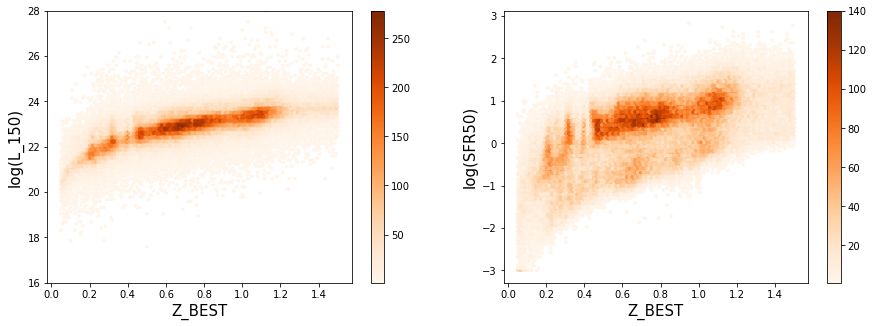

In [29]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
hb = ax[0].hexbin(table['Z_BEST_1'],np.log10(table['L150']),mincnt=1,cmap='Oranges')
cb = fig.colorbar(hb,ax=ax[0])
ax[0].set_xlabel('Z_BEST',size=15)
ax[0].set_ylabel('log(L_150)',size=15)
ax[0].set_ylim(16,28)
hb = ax[1].hexbin(table['Z_BEST_1'],np.log10(table['SFR_50']),mincnt=1,cmap='Oranges')
cb = fig.colorbar(hb,ax=ax[1])
ax[1].set_xlabel('Z_BEST',size=15)
ax[1].set_ylabel('log(SFR50)',size=15)
plt.show()

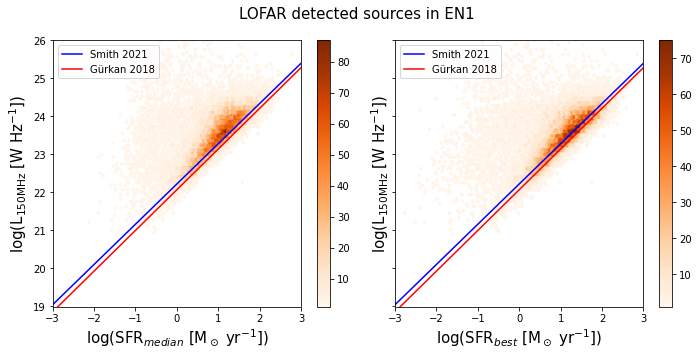

In [31]:
fig, ax = plt.subplots(1,2,figsize=(10,5),sharex='row',sharey='row')
hb = ax[0].hexbin(np.log10(table.loc[np.isfinite(table['Total_flux']),'SFR_50']),np.log10(table.loc[np.isfinite(table['Total_flux']),'L150']),mincnt=1,cmap='Oranges')
ax[0].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[0].set_ylabel('log(L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[0].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[0].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[0])
ax[0].set_xlim(-3,3)
ax[0].set_ylim(19,26)
ax[0].legend()
hb = ax[1].hexbin(np.log10(table.loc[np.isfinite(table['Total_flux']),'SFR_best']),np.log10(table.loc[np.isfinite(table['Total_flux']),'L150']),mincnt=1,cmap='Oranges')
ax[1].set_xlabel('log(SFR$_{best}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[1].set_ylabel('log(L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[1].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[1].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[1])
ax[1].legend()
fig.suptitle('LOFAR detected sources in '+field, size=15)
fig.tight_layout()
plt.show()

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


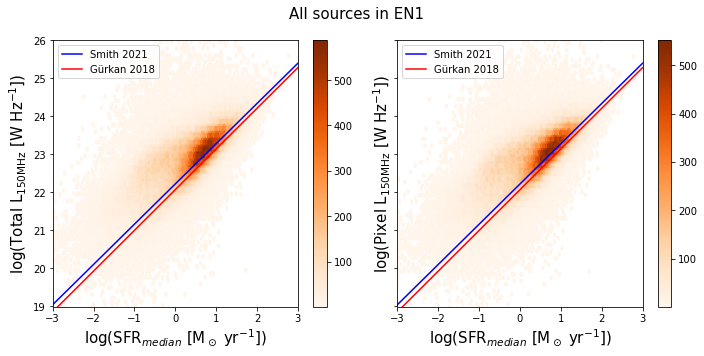

In [32]:
fig, ax = plt.subplots(1,2,figsize=(10,5),sharex='row',sharey='row')
hb = ax[0].hexbin(np.log10(table['SFR_50']),np.log10(table['L150']),mincnt=1,cmap='Oranges')
ax[0].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[0].set_ylabel('log(Total L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[0].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[0].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[0])
ax[0].set_xlim(-3,3)
ax[0].set_ylim(19,26)
ax[0].legend()
hb = ax[1].hexbin(np.log10(table['SFR_50']),np.log10(table['L150_pix']),mincnt=1,cmap='Oranges')
ax[1].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[1].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[1].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[1].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[1])
ax[1].legend()
fig.suptitle('All sources in '+field, size=15)
fig.tight_layout()
plt.show()

In [28]:
def SFR_smith(L150,mass):
    
    beta=1.058
    #beta_unc=0.007
    logL1=22.221
    #logL1_unc=0.008 
    #log10(L150) = 1.058*log10(SFR) + 22.221
    log10SFR = (np.log10(L150) - logL1)/beta
    SFR = 10**log10SFR
    #SFR_unc2 = ( (L150_unc/L150)**2 + (np.log(SFR)*beta_unc)**2 + (np.log(10)*logL1_unc)**2 )*((SFR/beta)**2)
    
    beta=0.903
    #beta_unc=0.012
    logLc=22.218
    #logLc_unc=0.016
    gamma=0.332
    #gamma_unc=0.037
    #log10(L150) = 0.9*log10(SFR) + 0.33*(M-10) + 22.22
    log10SFR = (np.log10(L150) - gamma*(mass-10) - logLc)/beta
    SFR_M = 10**log10SFR
    #SFR_M_unc2 = ( (L150_unc/L150)**2 + (np.log(SFR_M)*beta_unc)**2 + (np.log(10)*logLc_unc)**2 + (np.log(10)*(10-mass)*gamma_unc)**2 )*((SFR_M/beta)**2)

    return SFR, SFR_M

SFR_smith_v = np.vectorize(SFR_smith)

In [29]:
#table['SFR_L150'] = np.power(10,(np.log10(table['L150']) - 22.221)/1.058)
table['SFR_L150'], table['SFR_L150_M'] = SFR_smith_v(table['L150_noneg'],table['Mass_median_2'])

In [30]:
m = np.arange(8,12.4,0.2)

def SchreiberMS(m1,z): ## For plotting Schreiber+15 main sequence
    return m1-9 - 0.5 + (1.5*np.log10(1+z)) - 0.3*(np.fmax(m1-9 - 0.36-2.5*np.log10(1+z),0.))**2

def SpeagleMS(m1,z): ## For plotting Speagle+14 main sequence:
    age = cosmo.age(z).value
    return (0.84-0.026*age)*m1-6.51+0.11*age

def CarnallQ(m1,z): ## For plotting Carnall+20 sSFR quiescent limit:
    age = cosmo.age(z).value
    return m1+np.log10(0.2/age)-9

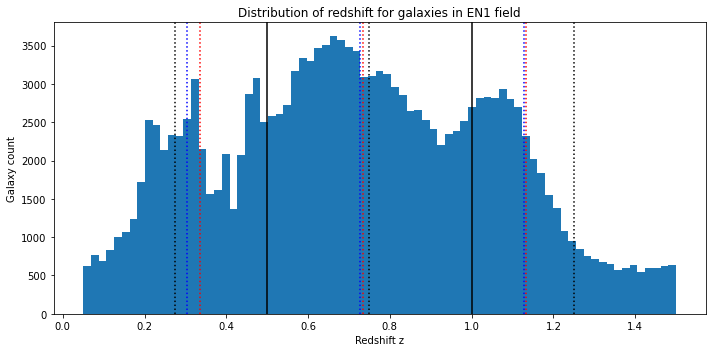

In [38]:
fig, ax = plt.subplots(figsize=(10,5))
# Plotting redshift histogram
ax.set_title('Distribution of redshift for galaxies in '+field+' field')
ax.set_xlabel('Redshift z')
ax.set_ylabel('Galaxy count')
ax.hist(table['Z_BEST_1'], 'auto')
for z1, z2 in zip([0.05,0.5,1.],[0.5,1.,1.5]):
    z_half = (z1+z2)/2
    data = table.query(SF)
    z_sfg = data.loc[(data['Z_BEST_1']>z1)&(data['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = table.query(quiescent)
    z_qg = data.loc[(data['Z_BEST_1']>z1)&(data['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    ax.axvline(z_half,ls=':',c='k')
    ax.axvline(z_sfg,ls=':',c='b')
    ax.axvline(z_qg,ls=':',c='r')
ax.axvline(0.5,c='k')
ax.axvline(1.,c='k')
fig.tight_layout()
plt.show()

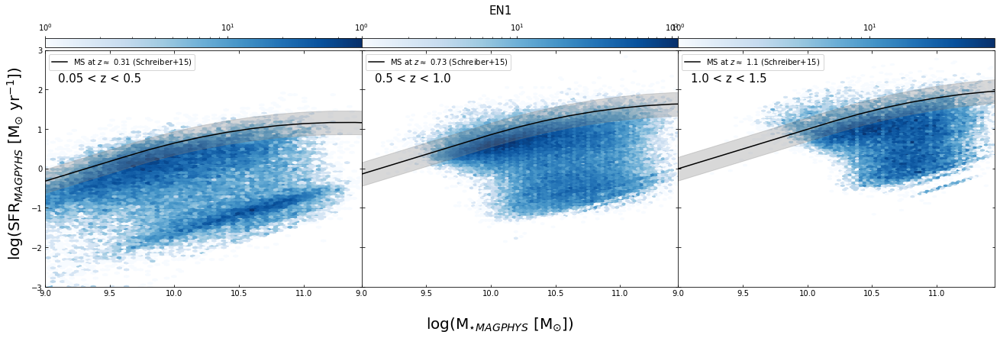

In [39]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    hb = ax[i].hexbin(np.log10(data['Mstar_50']),
                      np.log10(data['SFR_50']),
                      cmap='Blues',mincnt=1,bins='log')
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

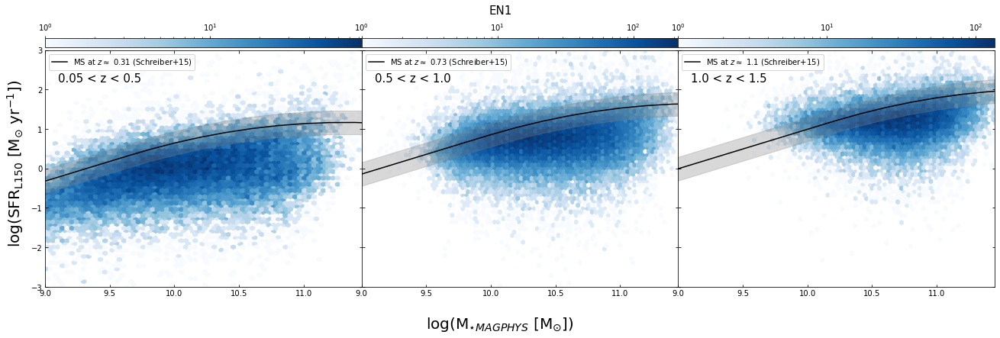

In [40]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    hb = ax[i].hexbin(np.log10(data['Mstar_50']),
                      np.log10(data['SFR_L150']),
                      cmap='Blues',mincnt=1,bins='log')
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

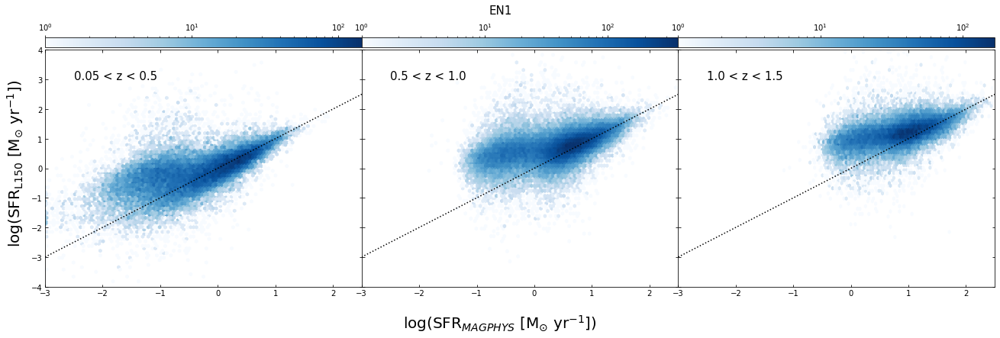

In [38]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    hb = ax[i].hexbin(np.log10(data['SFR_50']),
                      np.log10(data['SFR_L150']),
                      cmap='Blues',mincnt=1,bins='log')
    ax[i].plot([-3,3],[-3,3],linestyle=':',c='k')
    ax[i].text(-2.5,3.,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(-3,2.5)
    ax[i].set_ylim(-4,4)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(SFR$_{MAGPHYS}$ [M$_{\odot}$ yr$^{-1}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

In [31]:
table['SFR_ratio'] = table['SFR_L150']/table['SFR_50']
table['SFR_ratio_M'] = table['SFR_L150_M']/table['SFR_50']

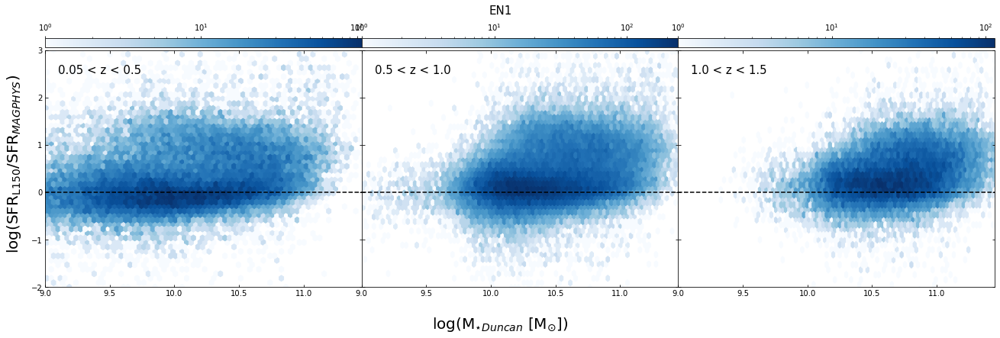

In [43]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    hb = ax[i].hexbin(data['Mass_median_2'],
                      np.log10(data['SFR_ratio']),
                      cmap='Blues',mincnt=1,bins='log')
    ax[i].axhline(0,linestyle='--',c='k')
    ax[i].text(9.1,2.5,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-2,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPHYS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

## Grouping galaxies by type, redshift and stellar mass

Here we can difine criteria to group by galaxy type (i.e. quiescent or star-forming) and in different redshift and stellar mass bins.

In [32]:
def create_bins(number,bin_width=1):
    q = np.floor(number/bin_width)
    return q*bin_width

In [33]:
mass_binwidth = 0.25
z_binwidth = 0.5

In [34]:
grouped_1 = table.groupby([create_bins(table.loc[:,'Z_BEST_1'],z_binwidth),create_bins(table.loc[:,'Mass_median_2'],mass_binwidth)])
stacked = grouped_1.median()[['Z_BEST_1','z','Mass_median_2','Mstar_50','SFR_50','pix_flux','L150','L150_pix','L150_noneg','SFR_L150','SFR_ratio']]

In [35]:
stacked['L150_medianpix'] = Lum_v(stacked['pix_flux'],stacked['Z_BEST_1'])*10**3 # Flux is in Jy, not mJy

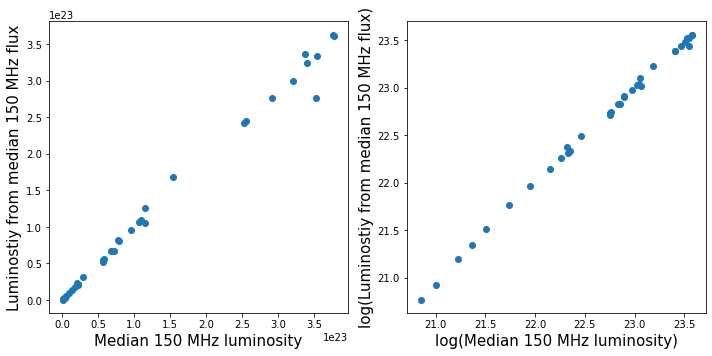

In [46]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
ax[0].scatter(stacked['L150'],stacked['L150_medianpix'])
ax[0].set_xlabel('Median 150 MHz luminosity',size=15)
ax[0].set_ylabel('Luminostiy from median 150 MHz flux',size=15)
ax[1].scatter(np.log10(stacked['L150']),np.log10(stacked['L150_medianpix']))
ax[1].set_xlabel('log(Median 150 MHz luminosity)',size=15)
ax[1].set_ylabel('log(Luminostiy from median 150 MHz flux)',size=15)
fig.tight_layout()
plt.show()

## From this point on we only use luminosities, not fluxes

In [61]:
stacked['SFR_16'] = grouped_1['SFR_50'].agg(lambda x: np.percentile(x,16))
stacked['SFR_84'] = grouped_1['SFR_50'].agg(lambda x: np.percentile(x,84))
stacked['L150_16'] = grouped_1['L150_noneg'].agg(lambda x: np.percentile(x,16))
stacked['L150_84'] = grouped_1['L150_noneg'].agg(lambda x: np.percentile(x,84))
stacked['Mass_16'] = grouped_1['Mass_median_2'].agg(lambda x: np.percentile(x,16))
stacked['Mass_84'] = grouped_1['Mass_median_2'].agg(lambda x: np.percentile(x,84))
stacked['SFR_L150_16'] = grouped_1['SFR_L150'].agg(lambda x: np.percentile(x,16))
stacked['SFR_L150_84'] = grouped_1['SFR_L150'].agg(lambda x: np.percentile(x,84))
stacked['SFR_ratio_16'] = grouped_1['SFR_ratio'].agg(lambda x: np.percentile(x,16))
stacked['SFR_ratio_84'] = grouped_1['SFR_ratio'].agg(lambda x: np.percentile(x,84))

In [36]:
stacked[['SFR_16','L150_16','Mass_16','SFR_L150_16','SFR_ratio_16']] = grouped_1[['SFR_50','L150_noneg','Mass_median_2','SFR_L150','SFR_ratio']].agg(lambda x: np.percentile(x,16))
stacked[['SFR_84','L150_84','Mass_84','SFR_L150_84','SFR_ratio_84']] = grouped_1[['SFR_50','L150_noneg','Mass_median_2','SFR_L150','SFR_ratio']].agg(lambda x: np.percentile(x,84))

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


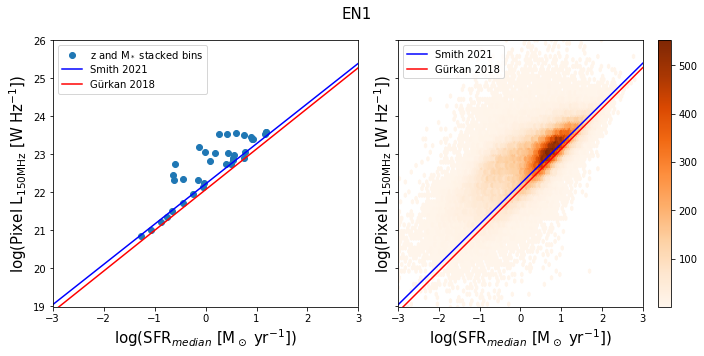

In [62]:
fig, ax = plt.subplots(1,2,figsize=(10,5),sharex='row',sharey='row')
ax[0].scatter(np.log10(stacked['SFR_50']),np.log10(stacked['L150_noneg']),label='z and M$_*$ stacked bins ')
ax[0].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[0].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[0].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[0].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
ax[0].set_xlim(-3,3)
ax[0].set_ylim(19,26)
ax[0].legend()
hb = ax[1].hexbin(np.log10(table['SFR_50']),np.log10(table['L150_pix']),mincnt=1,cmap='Oranges')
ax[1].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[1].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[1].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[1].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[1])
ax[1].legend()
fig.suptitle(field, size=15)
fig.tight_layout()
plt.show()

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


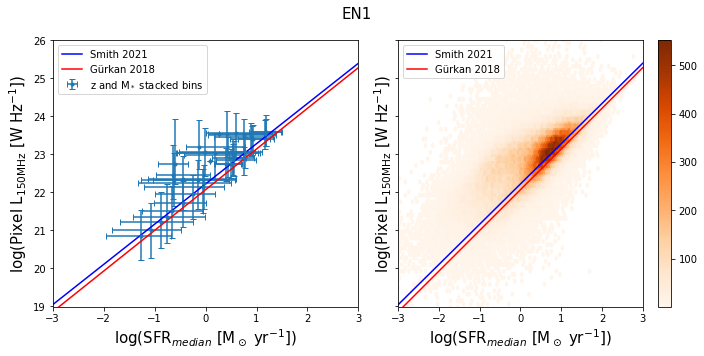

In [37]:
fig, ax = plt.subplots(1,2,figsize=(10,5),sharex='row',sharey='row')
ax[0].errorbar(np.log10(stacked['SFR_50']),np.log10(stacked['L150_noneg']),
               xerr=[np.log10(stacked['SFR_50'])-np.log10(stacked['SFR_16']),
                     np.log10(stacked['SFR_84'])-np.log10(stacked['SFR_50'])],
               yerr=[np.log10(stacked['L150_noneg'])-np.log10(stacked['L150_16']),
                     np.log10(stacked['L150_84'])-np.log10(stacked['L150_noneg'])],               
               label='z and M$_*$ stacked bins ',fmt='.',capsize=3.)
ax[0].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[0].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[0].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[0].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
ax[0].set_xlim(-3,3)
ax[0].set_ylim(19,26)
ax[0].legend()
hb = ax[1].hexbin(np.log10(table['SFR_50']),np.log10(table['L150_pix']),mincnt=1,cmap='Oranges')
ax[1].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[1].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[1].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[1].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[1])
ax[1].legend()
fig.suptitle(field, size=15)
fig.tight_layout()
plt.show()

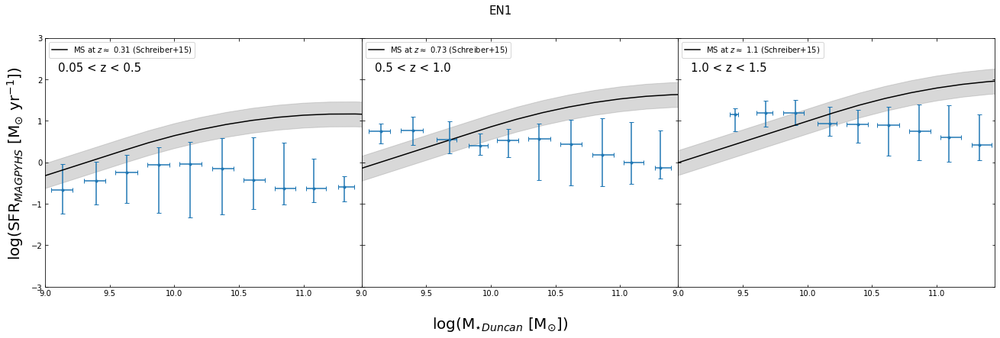

In [38]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = stacked[(stacked['Z_BEST_1']>z1)&(stacked['Z_BEST_1']<=z2)]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

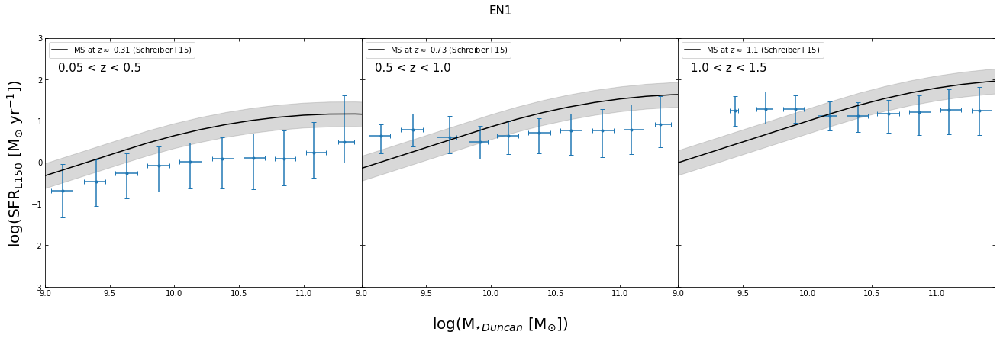

In [39]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = stacked[(stacked['Z_BEST_1']>z1)&(stacked['Z_BEST_1']<=z2)]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

## Exploring color-color space

By choosing three rest-frame bands (in this case, NUV, R and J), we can define two colors which we will use to select galaxies as quiescent or star-forming. In order to have easy acces to these colors for later operations, we will add two new columns to the table based on the values of other columns.

In [37]:
### DON'T SKIP ###
table['NUVR'] = table['NUV_rest']-table['r_rest_2']
table['RJ'] = table['r_rest_2']-table['J_rest_2']

In [38]:
quiescent = '((NUVR>3.1)&(NUVR>3*RJ+1))'
SF = '((NUVR<=3.1)|(NUVR<=3*RJ+1))'

In [39]:
table['Q_limit'] = (10**-9)*0.2/cosmo.age(table['Z_BEST_1']).value
table['sSFR_M'] = table['SFR_50']/table['Mstar_50']
table['sSFR_D'] = table['SFR_50']/np.power(10,table['Mass_median_2'])

In [92]:
print(len(table.query(SF).loc[(table['sSFR_M']>table['Q_limit'])]))
print(len(table.query(SF).loc[(table['sSFR_M']<table['Q_limit'])]))
print(len(table.query(quiescent).loc[(table['sSFR_M']>table['Q_limit'])]))
print(len(table.query(quiescent).loc[(table['sSFR_M']<table['Q_limit'])]))

107952
9531
4932
38210


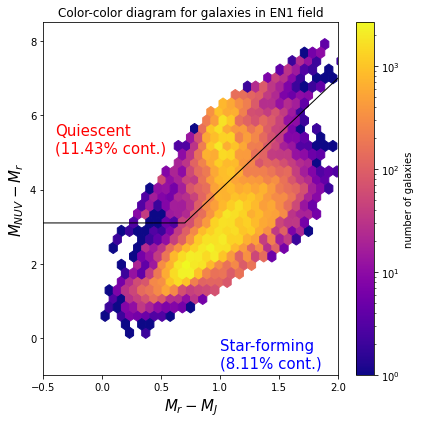

In [44]:
fig, axs = plt.subplots(figsize=(6,6))
axs.set_title('Color-color diagram for galaxies in '+field+' field')
axs.set_xlabel("$M_{r} - M_{J}$",fontsize=15)
axs.set_ylabel("$M_{NUV} - M_{r}$",fontsize=15)
hb = axs.hexbin(table['RJ'],table['NUVR'],bins='log',mincnt=1,cmap='plasma',gridsize=30)
cb = fig.colorbar(hb, ax=axs)
cb.set_label('number of galaxies')
axs.plot([-80,0.7,80],[3.1,3.1,241],color='k',linewidth=1,label='Color selection boundary')
axs.set_xlim(xmin=-0.5,xmax=2.)
axs.set_ylim(ymin=-1,ymax=8.5)
sfg_cont = len(table.query(SF).loc[(table['sSFR_M']<table['Q_limit'])])/len(table.query(SF))
qg_cont = len(table.query(quiescent).loc[(table['sSFR_M']>table['Q_limit'])])/len(table.query(quiescent))
axs.text(-0.4,7.,f'Quiescent\n({qg_cont:.2%} contamination)',size=15,color='r')
axs.text(1.95,0.,f'Star-forming\n({sfg_cont:.2%} contamination)',size=15,color='b',ha='right')
fig.tight_layout()
plt.show()

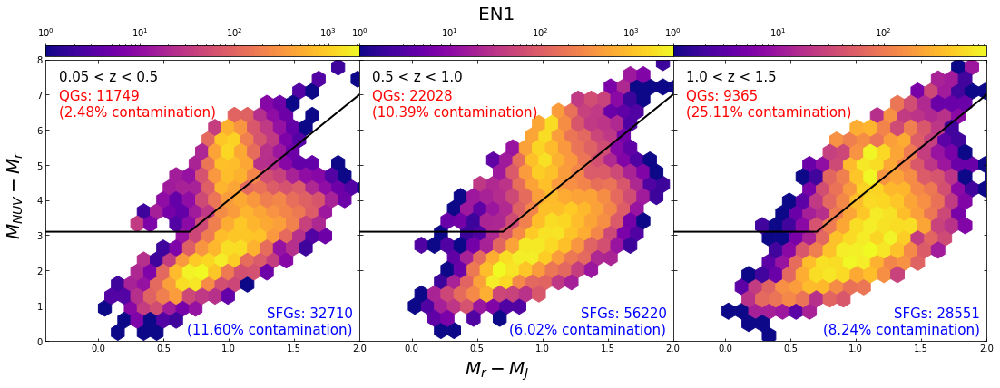

In [84]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='plasma',bins='log',mincnt=1,gridsize=20)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(data.query(quiescent))
    sfg=len(data.query(SF))
    qg_cont = len(data.query(quiescent).loc[(data['sSFR_M']>data['Q_limit'])])/qg
    sfg_cont = len(data.query(SF).loc[(data['sSFR_M']<data['Q_limit'])])/sfg
    ax[i].text(-0.3,7.4,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].text(-0.3,6.4,f'QGs: {qg}\n({qg_cont:.2%} contamination)',size=15,color='r')
    ax[i].text(1.95,0.2,f'SFGs: {sfg}\n({sfg_cont:.2%} contamination)',size=15,color='b',ha='right')
    ax[i].set_xlim(-0.4,2)
    ax[i].set_ylim(0,8)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.suptitle(field,fontsize=20)
fig.text(0.5, 0.04,'$M_{r} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{r}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
plt.show()

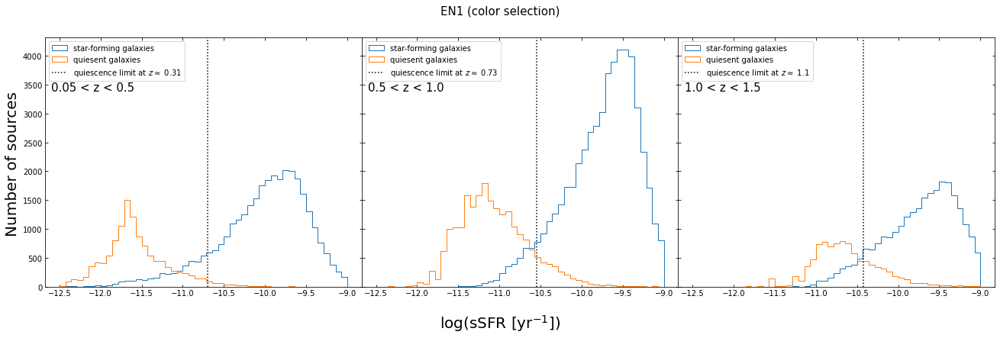

In [42]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    #z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    ax[i].hist(np.log10(data.query(SF)['sSFR_M']),histtype='step',bins=np.linspace(-12.5,-9,50),label='star-forming galaxies')
    ax[i].hist(np.log10(data.query(quiescent)['sSFR_M']),histtype='step',bins=np.linspace(-12.5,-9,50),label='quiesent galaxies')
    ax[i].text(-12.6,3400,f'{z1} < z < {z2}',size=15,color='k')
    #ax[i].set_xlim(9,11.45)
    #ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].axvline(np.log10((10**-9)*0.2/cosmo.age(z_median).value),ls=':',c='k',label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].legend(loc='upper left')
fig.text(0.5, 0.0,"log(sSFR [yr$^{-1}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"Number of sources", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+" (color selection)", size=15)
plt.show()

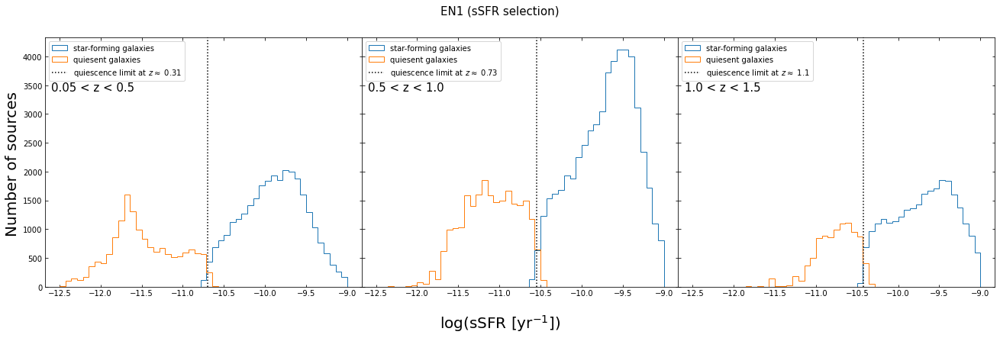

In [43]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    #z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    ax[i].hist(np.log10(data.loc[data['sSFR_M']>data['Q_limit'],'sSFR_M']),histtype='step',bins=np.linspace(-12.5,-9,50),label='star-forming galaxies')
    ax[i].hist(np.log10(data.loc[data['sSFR_M']<data['Q_limit'],'sSFR_M']),histtype='step',bins=np.linspace(-12.5,-9,50),label='quiesent galaxies')
    ax[i].text(-12.6,3400,f'{z1} < z < {z2}',size=15,color='k')
    #ax[i].set_xlim(9,11.45)
    #ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].axvline(np.log10((10**-9)*0.2/cosmo.age(z_median).value),ls=':',c='k',label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].legend(loc='upper left')
fig.text(0.5, 0.0,"log(sSFR [yr$^{-1}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"Number of sources", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+" (sSFR selection)", size=15)
plt.show()

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


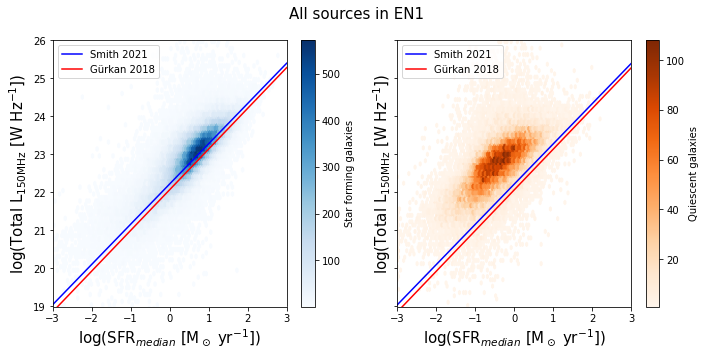

In [63]:
fig, ax = plt.subplots(1,2,figsize=(10,5),sharex='row',sharey='row')
hb = ax[0].hexbin(np.log10(table.query(SF)['SFR_50']),np.log10(table.query(SF)['L150']),mincnt=1,cmap='Blues')
ax[0].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[0].set_ylabel('log(Total L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[0].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[0].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[0],label='Star forming galaxies')
ax[0].set_xlim(-3,3)
ax[0].set_ylim(19,26)
ax[0].legend()
hb = ax[1].hexbin(np.log10(table.query(quiescent)['SFR_50']),np.log10(table.query(quiescent)['L150']),mincnt=1,cmap='Oranges')
ax[1].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[1].set_ylabel('log(Total L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[1].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[1].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[1],label='Quiescent galaxies')
ax[1].legend()
fig.suptitle('All sources in '+field, size=15)
fig.tight_layout()
plt.show()

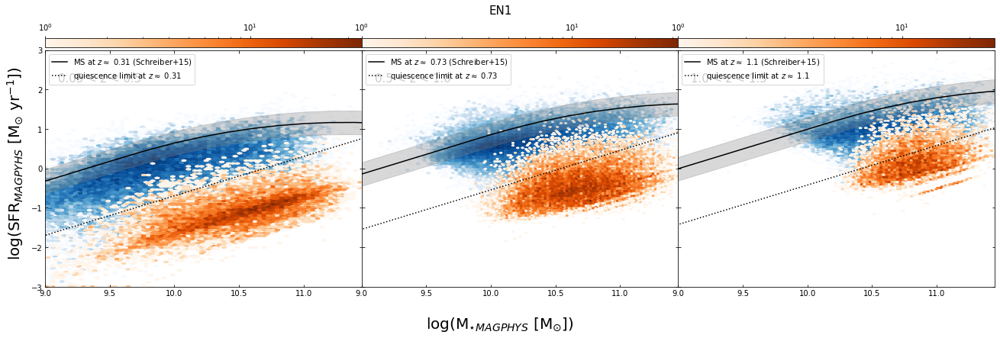

In [56]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    hb = ax[i].hexbin(np.log10(data.query(SF)['Mstar_50']),
                      np.log10(data.query(SF)['SFR_50']),
                      cmap='Blues',mincnt=1,bins='log')
    hb = ax[i].hexbin(np.log10(data.query(quiescent)['Mstar_50']),
                      np.log10(data.query(quiescent)['SFR_50']),
                      cmap='Oranges',mincnt=1,bins='log')
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

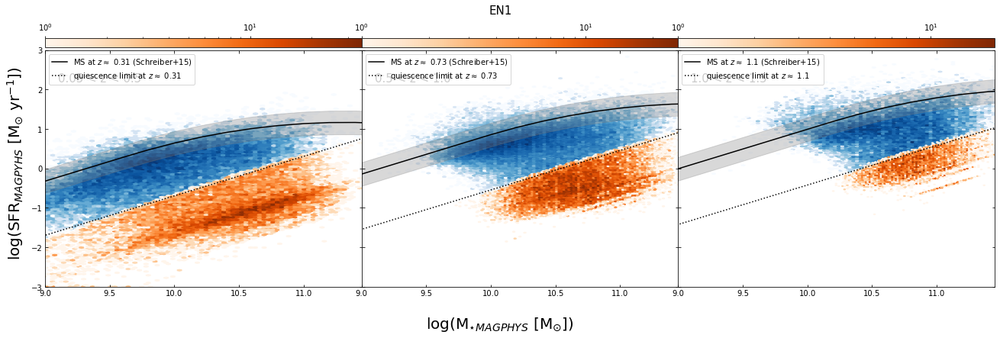

In [66]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)&(table['sSFR_M']>table['Q_limit'])]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    hb = ax[i].hexbin(np.log10(data['Mstar_50']),
                      np.log10(data['SFR_50']),
                      cmap='Blues',mincnt=1,bins='log')
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)&(table['sSFR_M']<table['Q_limit'])]
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    hb = ax[i].hexbin(np.log10(data['Mstar_50']),
                      np.log10(data['SFR_50']),
                      cmap='Oranges',mincnt=1,bins='log')
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

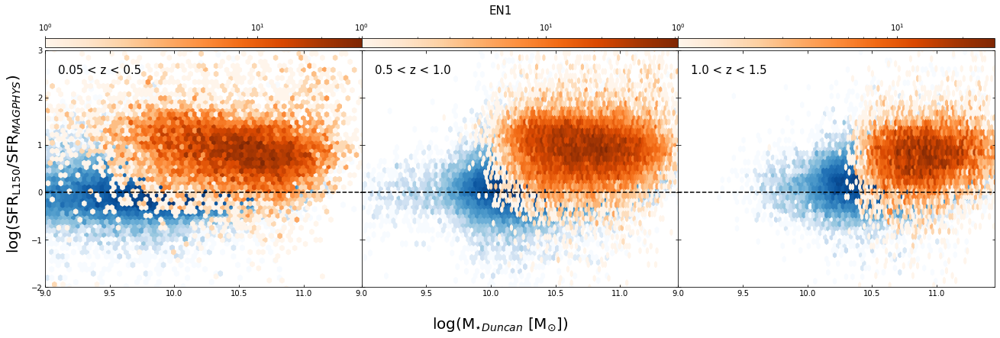

In [66]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    hb = ax[i].hexbin(data.query(SF)['Mass_median_2'],
                      np.log10(data.query(SF)['SFR_ratio']),
                      cmap='Blues',mincnt=1,bins='log')
    hb = ax[i].hexbin(data.query(quiescent)['Mass_median_2'],
                      np.log10(data.query(quiescent)['SFR_ratio']),
                      cmap='Oranges',mincnt=1,bins='log')
    ax[i].axhline(0,linestyle='--',c='k')
    ax[i].text(9.1,2.5,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-2,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("top", size="4%", pad=0.05)
    cb = fig.colorbar(hb, cax=cax,orientation='horizontal')
    cax.tick_params(which='both',top=True,labeltop=True,bottom=False,labelbottom=False)
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPHYS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

## Stacking according to M$_{\star Duncan}$

In [51]:
grouped_2 = table.query(SF).groupby([create_bins(table.loc[:,'Z_BEST_1'],z_binwidth),create_bins(table.loc[:,'Mass_median_2'],mass_binwidth)])
stacked_SFG = grouped_2.median()[['Z_BEST_1','z','Mass_median_2','Mstar_50','SFR_50','pix_flux','L150','L150_pix','L150_noneg','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']]

stacked_SFG[['SFR_16','L150_16','Mass_16','SFR_L150_16','SFR_L150_16_M','SFR_ratio_16','SFR_ratio_16_M']] = grouped_2[
    ['SFR_50','L150_noneg','Mass_median_2','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,16))
stacked_SFG[['SFR_84','L150_84','Mass_84','SFR_L150_84','SFR_L150_84_M','SFR_ratio_84','SFR_ratio_84_M']] = grouped_2[
    ['SFR_50','L150_noneg','Mass_median_2','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,84))

In [52]:
grouped_3 = table.query(quiescent).groupby([create_bins(table.loc[:,'Z_BEST_1'],z_binwidth),create_bins(table.loc[:,'Mass_median_2'],mass_binwidth)])
stacked_QG = grouped_3.median()[['Z_BEST_1','z','Mass_median_2','Mstar_50','SFR_50','pix_flux','L150','L150_pix','L150_noneg','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']]

stacked_QG[['SFR_16','L150_16','Mass_16','SFR_L150_16','SFR_L150_16_M','SFR_ratio_16','SFR_ratio_16_M']] = grouped_3[
    ['SFR_50','L150_noneg','Mass_median_2','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,16))
stacked_QG[['SFR_84','L150_84','Mass_84','SFR_L150_84','SFR_L150_84_M','SFR_ratio_84','SFR_ratio_84_M']] = grouped_3[
    ['SFR_50','L150_noneg','Mass_median_2','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,84))

C:\Users\bruno\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


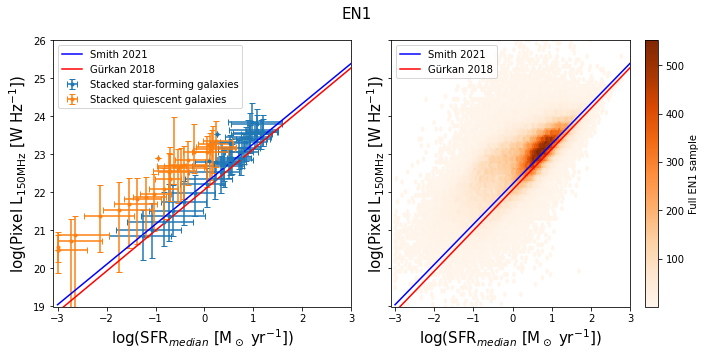

In [47]:
fig, ax = plt.subplots(1,2,figsize=(10,5),sharex='row',sharey='row')
#ax[0].scatter(np.log10(stacked_SFG['SFR_50']),np.log10(stacked_SFG['L150']),label='Stacked star-forming galaxies')
ax[0].errorbar(np.log10(stacked_SFG['SFR_50']),np.log10(stacked_SFG['L150_noneg']),
               xerr=[np.log10(stacked_SFG['SFR_50'])-np.log10(stacked_SFG['SFR_16']),
                     np.log10(stacked_SFG['SFR_84'])-np.log10(stacked_SFG['SFR_50'])],
               yerr=[np.log10(stacked_SFG['L150_noneg'])-np.log10(stacked_SFG['L150_16']),
                     np.log10(stacked_SFG['L150_84'])-np.log10(stacked_SFG['L150_noneg'])],
               label='Stacked star-forming galaxies',fmt='.',capsize=3.)
#ax[0].scatter(np.log10(stacked_QG['SFR_50']),np.log10(stacked_QG['L150']),label='Stacked quiescent galaxies')
ax[0].errorbar(np.log10(stacked_QG['SFR_50']),np.log10(stacked_QG['L150_noneg']),
               xerr=[np.log10(stacked_QG['SFR_50'])-np.log10(stacked_QG['SFR_16']),
                     np.log10(stacked_QG['SFR_84'])-np.log10(stacked_QG['SFR_50'])],
               yerr=[np.log10(stacked_QG['L150_noneg'])-np.log10(stacked_QG['L150_16']),
                     np.log10(stacked_QG['L150_84'])-np.log10(stacked_QG['L150_noneg'])],
               label='Stacked quiescent galaxies',fmt='.',capsize=3.)
ax[0].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[0].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[0].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[0].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
ax[0].set_xlim(-3.1,3)
ax[0].set_ylim(19,26)
ax[0].legend()
hb = ax[1].hexbin(np.log10(table['SFR_50']),np.log10(table['L150_pix']),mincnt=1,cmap='Oranges')
ax[1].set_xlabel('log(SFR$_{median}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax[1].set_ylabel('log(Pixel L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax[1].plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax[1].plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
cb = fig.colorbar(hb,ax=ax[1],label='Full '+field+' sample')
ax[1].legend()
fig.suptitle(field, size=15)
fig.tight_layout()
plt.show()

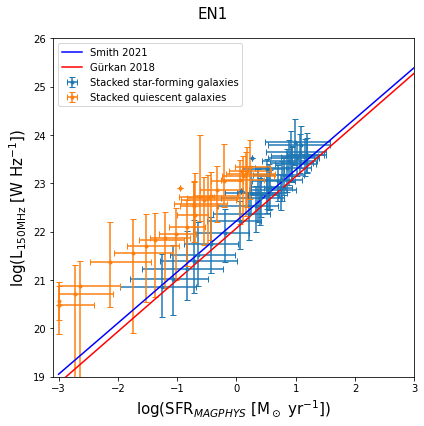

In [46]:
fig, ax = plt.subplots(figsize=(6,6),sharex='row',sharey='row')
ax.errorbar(np.log10(stacked_SFG['SFR_50']),np.log10(stacked_SFG['L150_noneg']),
               xerr=[np.log10(stacked_SFG['SFR_50'])-np.log10(stacked_SFG['SFR_16']),
                     np.log10(stacked_SFG['SFR_84'])-np.log10(stacked_SFG['SFR_50'])],
               yerr=[np.log10(stacked_SFG['L150_noneg'])-np.log10(stacked_SFG['L150_16']),
                     np.log10(stacked_SFG['L150_84'])-np.log10(stacked_SFG['L150_noneg'])],
               label='Stacked star-forming galaxies',fmt='.',capsize=3.)

ax.errorbar(np.log10(stacked_QG['SFR_50']),np.log10(stacked_QG['L150_noneg']),
               xerr=[np.log10(stacked_QG['SFR_50'])-np.log10(stacked_QG['SFR_16']),
                     np.log10(stacked_QG['SFR_84'])-np.log10(stacked_QG['SFR_50'])],
               yerr=[np.log10(stacked_QG['L150_noneg'])-np.log10(stacked_QG['L150_16']),
                     np.log10(stacked_QG['L150_84'])-np.log10(stacked_QG['L150_noneg'])],
               label='Stacked quiescent galaxies',fmt='.',capsize=3.)
ax.set_xlabel('log(SFR$_{MAGPHYS}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax.set_ylabel('log(L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax.plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax.plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
ax.set_xlim(-3.1,3)
ax.set_ylim(19,26)
ax.legend()
fig.suptitle(field, size=15)
fig.tight_layout()
plt.show()

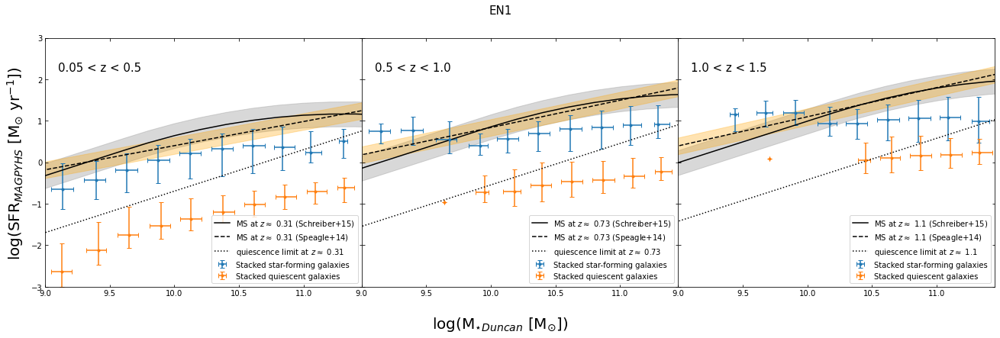

In [53]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

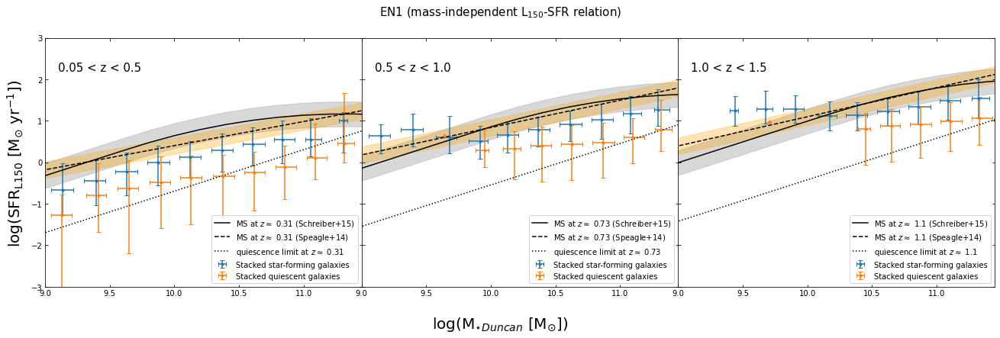

In [54]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

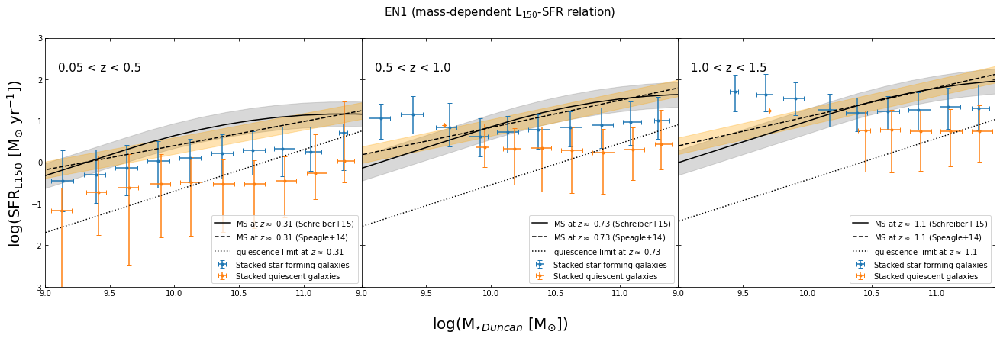

In [55]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150_M']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150_M'])-np.log10(data['SFR_L150_16_M']),
                         np.log10(data['SFR_L150_84_M'])-np.log10(data['SFR_L150_M'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150_M']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150_M'])-np.log10(data['SFR_L150_16_M']),
                         np.log10(data['SFR_L150_84_M'])-np.log10(data['SFR_L150_M'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-dependent L$_{150}$-SFR relation)', size=15)
plt.show()

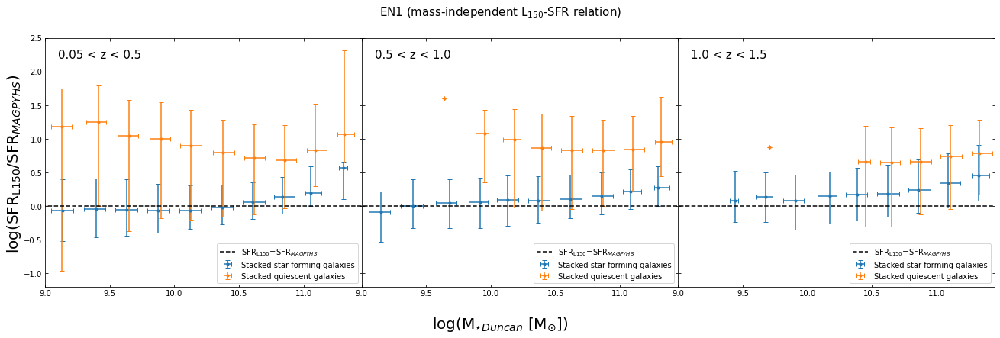

In [56]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],#label='Stacked star-forming galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_16']),
                         np.log10(data['SFR_ratio_84'])-np.log10(data['SFR_ratio'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],#label='Stacked quiescent galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_16']),
                         np.log10(data['SFR_ratio_84'])-np.log10(data['SFR_ratio'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

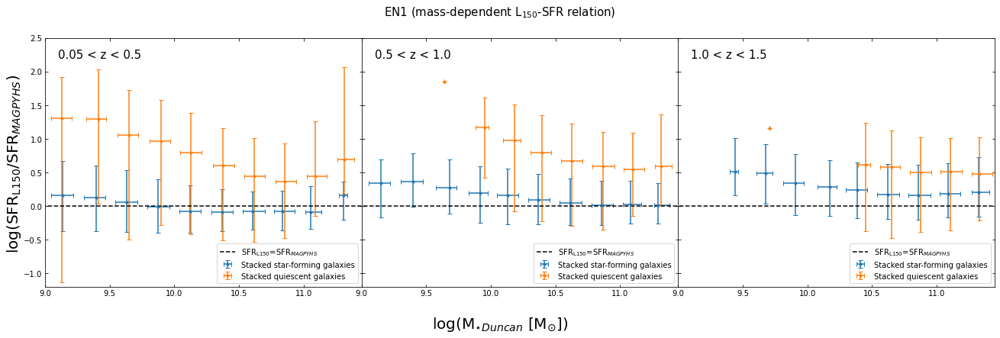

In [57]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio_M']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],#label='Stacked star-forming galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio_M'])-np.log10(data['SFR_ratio_16_M']),
                         np.log10(data['SFR_ratio_84_M'])-np.log10(data['SFR_ratio_M'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio_M']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],#label='Stacked quiescent galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio_M'])-np.log10(data['SFR_ratio_16_M']),
                         np.log10(data['SFR_ratio_84_M'])-np.log10(data['SFR_ratio_M'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-dependent L$_{150}$-SFR relation)', size=15)
plt.show()

## Stacking according to M$_{\star Magphys}$

In [58]:
grouped_4 = table.query(SF).groupby([create_bins(table.loc[:,'Z_BEST_1'],z_binwidth),create_bins(np.log10(table.loc[:,'Mstar_50']),mass_binwidth)])
stacked_SFG_magphys = grouped_4.median()[['Z_BEST_1','z','Mass_median_2','Mstar_50','SFR_50','pix_flux','L150','L150_pix','L150_noneg','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']]

stacked_SFG_magphys[['SFR_16','L150_16','Mass_16','SFR_L150_16','SFR_L150_16_M','SFR_ratio_16','SFR_ratio_16_M']] = grouped_4[
    ['SFR_50','L150_noneg','Mstar_50','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,16))
stacked_SFG_magphys[['SFR_84','L150_84','Mass_84','SFR_L150_84','SFR_L150_84_M','SFR_ratio_84','SFR_ratio_84_M']] = grouped_4[
    ['SFR_50','L150_noneg','Mstar_50','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,84))

In [59]:
grouped_5 = table.query(quiescent).groupby([create_bins(table.loc[:,'Z_BEST_1'],z_binwidth),create_bins(np.log10(table.loc[:,'Mstar_50']),mass_binwidth)])
stacked_QG_magphys = grouped_5.median()[['Z_BEST_1','z','Mass_median_2','Mstar_50','SFR_50','pix_flux','L150','L150_pix','L150_noneg','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']]

stacked_QG_magphys[['SFR_16','L150_16','Mass_16','SFR_L150_16','SFR_L150_16_M','SFR_ratio_16','SFR_ratio_16_M']] = grouped_5[
    ['SFR_50','L150_noneg','Mstar_50','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,16))
stacked_QG_magphys[['SFR_84','L150_84','Mass_84','SFR_L150_84','SFR_L150_84_M','SFR_ratio_84','SFR_ratio_84_M']] = grouped_5[
    ['SFR_50','L150_noneg','Mstar_50','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,84))

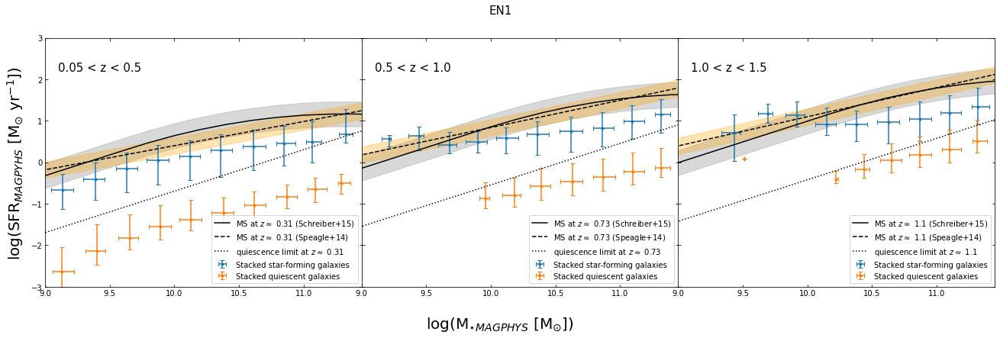

In [60]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_50']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_50']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

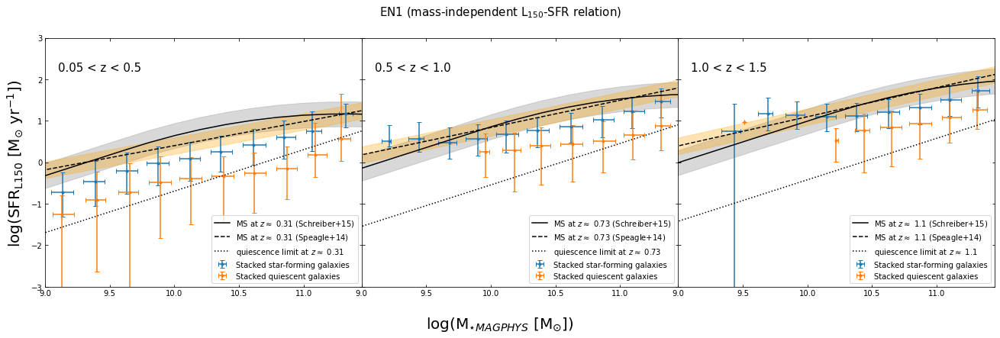

In [61]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

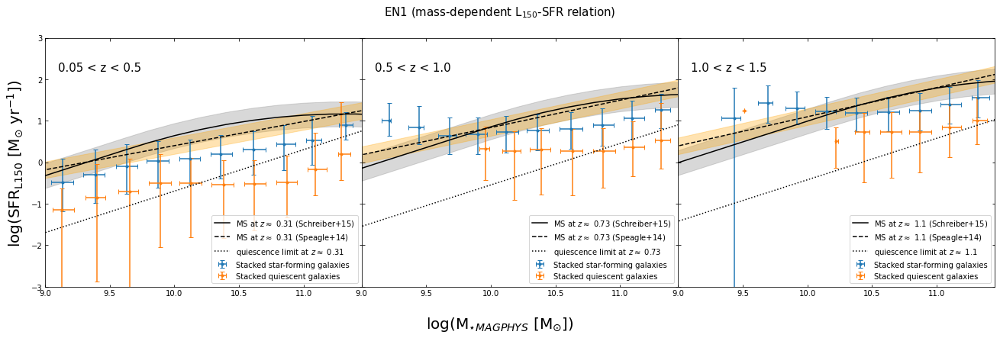

In [62]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150_M']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150_M'])-np.log10(data['SFR_L150_16_M']),
                         np.log10(data['SFR_L150_84_M'])-np.log10(data['SFR_L150_M'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150_M']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150_M'])-np.log10(data['SFR_L150_16_M']),
                         np.log10(data['SFR_L150_84_M'])-np.log10(data['SFR_L150_M'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-dependent L$_{150}$-SFR relation)', size=15)
plt.show()

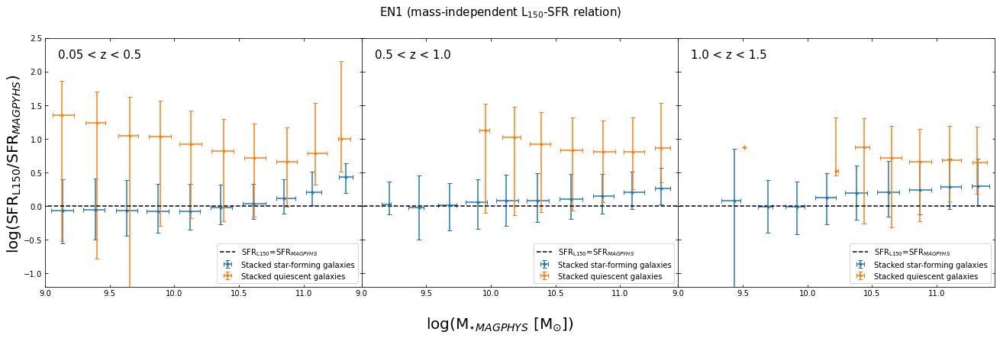

In [63]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_ratio']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_16']),
                         np.log10(data['SFR_ratio_84'])-np.log10(data['SFR_ratio'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_ratio']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_16']),
                         np.log10(data['SFR_ratio_84'])-np.log10(data['SFR_ratio'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

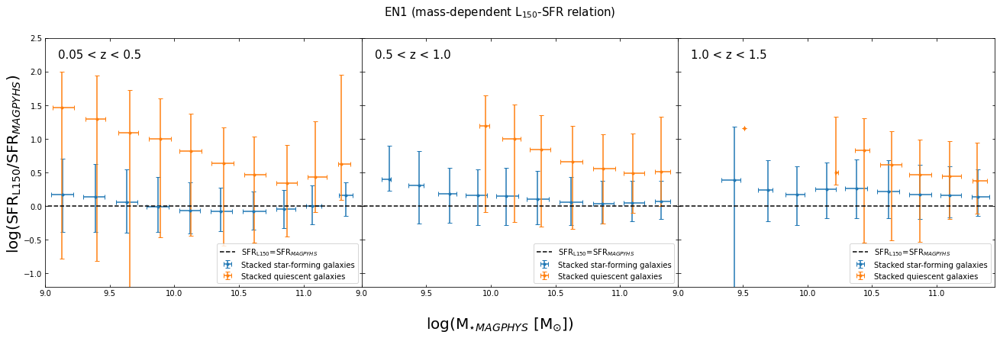

In [64]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_ratio_M']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_ratio_M'])-np.log10(data['SFR_ratio_16_M']),
                         np.log10(data['SFR_ratio_84_M'])-np.log10(data['SFR_ratio_M'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_ratio_M']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_ratio_M'])-np.log10(data['SFR_ratio_16_M']),
                         np.log10(data['SFR_ratio_84_M'])-np.log10(data['SFR_ratio_M'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-dependent L$_{150}$-SFR relation)', size=15)
plt.show()

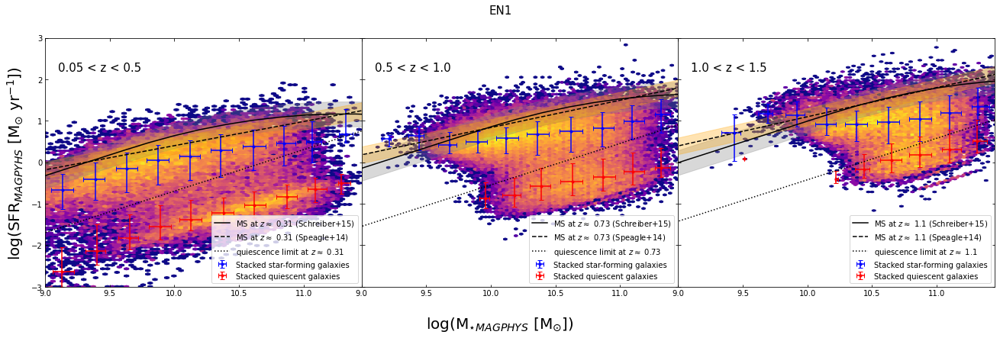

In [106]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    hb = ax[i].hexbin(np.log10(data['Mstar_50']),
                      np.log10(data['SFR_50']),
                      cmap='plasma',mincnt=1,bins='log')
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_50']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked star-forming galaxies',fmt='.b',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_50']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked quiescent galaxies',fmt='.r',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

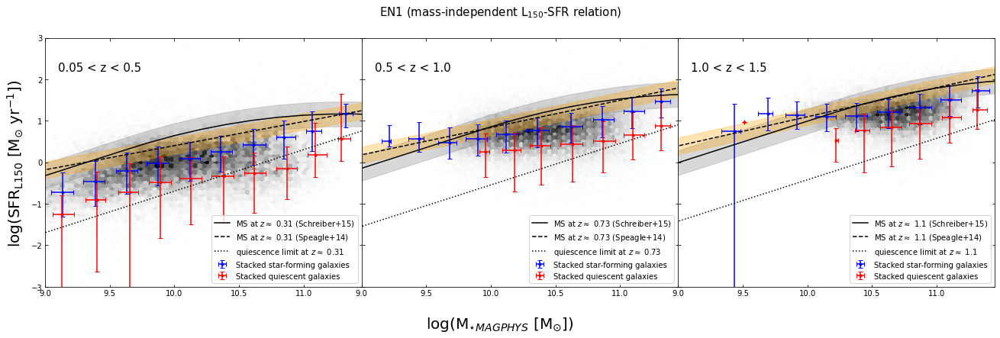

In [103]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = table[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2)]
    hb = ax[i].hexbin(np.log10(data['Mstar_50']),
                      np.log10(data['SFR_L150']),
                      cmap='Greys',mincnt=1)#,bins='log')
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked star-forming galaxies',fmt='.b',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_16']),
                         np.log10(data['Mass_84'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked quiescent galaxies',fmt='.r',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

## Getting uncertainties on median using median statistics from Gott et al. (2001)

In [77]:
from math import lgamma
def logprob(i,N):
    return -N*np.log(2.)+lgamma(N+1)-lgamma(i+1)-lgamma(N-i+1) # computing in logarithm makes working with large numbers easier

In [ ]:
def median_bounds(series): # must be a Pandas Series!
    N = len(series)
    arr = np.exp(np.array([logprob(i,N) for i in np.arange(N)])).cumsum()
    
    #arr = np.array([logprob(i,N) for i in np.arange(N)])
    #arr = np.exp(arr)
    #arr = arr.cumsum()
    return series.sort_values()[(arr >= 0.025)&(arr <= 0.975)].iloc[[0,-1]].to_list()

In [78]:
def lower_bound(N):
    arr = np.exp(np.array([logprob(i,N) for i in np.arange(N+1)])).cumsum()
    #new_arr = np.arange(N+1)[(arr < 0.16)]
    new_arr = np.arange(N+1)[(arr < 0.025)]
    if len(new_arr)<=1:
        return 0
    else:
        return new_arr[-1] - 1
lower_bound_V = np.vectorize(lower_bound)

In [79]:
def upper_bound(N):
    arr = np.exp(np.array([logprob(i,N) for i in np.arange(N+1)])).cumsum()
    #new_arr = np.arange(N+1)[(arr > 0.84)]
    new_arr = np.arange(N+1)[(arr > 0.975)]
    if len(new_arr)<=1:
        return -1
    else:
        return new_arr[0] - 1
upper_bound_V = np.vectorize(upper_bound)

In [119]:
upper_bound(9)

[0.00195312 0.01953125 0.08984375 0.25390625 0.5        0.74609375
 0.91015625 0.98046875 0.99804687 1.        ]


6

In [88]:
SFG_lb, SFG_ub = [lower_bound_V(grouped_2.size()),upper_bound_V(grouped_2.size())]
stacked_SFG['SFR_ratio_l'] = [grouped_2.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_2.groups.keys())]
stacked_SFG['SFR_ratio_u'] = [grouped_2.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_2.groups.keys())]
stacked_SFG['SFR_50_l'] = [grouped_2.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_2.groups.keys())]
stacked_SFG['SFR_50_u'] = [grouped_2.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_2.groups.keys())]
stacked_SFG['SFR_L150_l'] = [grouped_2.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_2.groups.keys())]
stacked_SFG['SFR_L150_u'] = [grouped_2.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_2.groups.keys())]
stacked_SFG['Mass_l'] = [grouped_2.get_group(name)['Mass_median_2'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_2.groups.keys())]
stacked_SFG['Mass_u'] = [grouped_2.get_group(name)['Mass_median_2'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_2.groups.keys())]

In [87]:
QG_lb, QG_ub = [lower_bound_V(grouped_3.size()),upper_bound_V(grouped_3.size())]
stacked_QG['SFR_ratio_l'] = [grouped_3.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_3.groups.keys())]
stacked_QG['SFR_ratio_u'] = [grouped_3.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_3.groups.keys())]
stacked_QG['SFR_50_l'] = [grouped_3.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_3.groups.keys())]
stacked_QG['SFR_50_u'] = [grouped_3.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_3.groups.keys())]
stacked_QG['SFR_L150_l'] = [grouped_3.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_3.groups.keys())]
stacked_QG['SFR_L150_u'] = [grouped_3.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_3.groups.keys())]
stacked_QG['Mass_l'] = [grouped_3.get_group(name)['Mass_median_2'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_3.groups.keys())]
stacked_QG['Mass_u'] = [grouped_3.get_group(name)['Mass_median_2'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_3.groups.keys())]

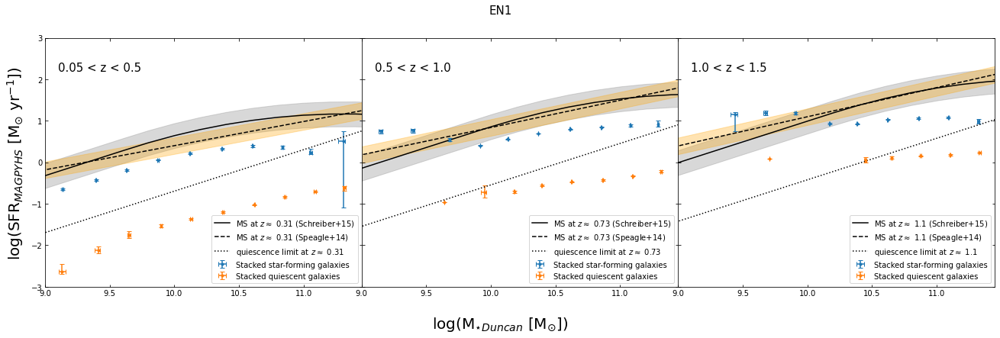

In [91]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_l'],
                         data['Mass_u']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_50_l']),
                         np.log10(data['SFR_50_u'])-np.log10(data['SFR_50'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_l'],
                         data['Mass_u']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_50_l']),
                         np.log10(data['SFR_50_u'])-np.log10(data['SFR_50'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

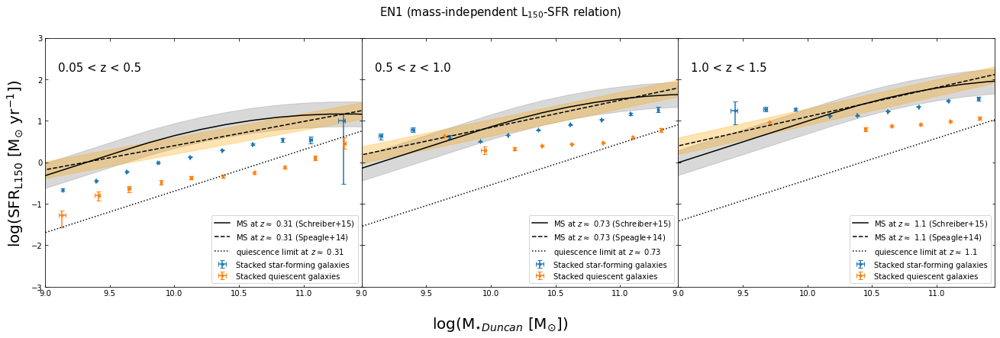

In [92]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_l'],
                         data['Mass_u']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_l']),
                         np.log10(data['SFR_L150_u'])-np.log10(data['SFR_L150'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_l'],
                         data['Mass_u']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_l']),
                         np.log10(data['SFR_L150_u'])-np.log10(data['SFR_L150'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

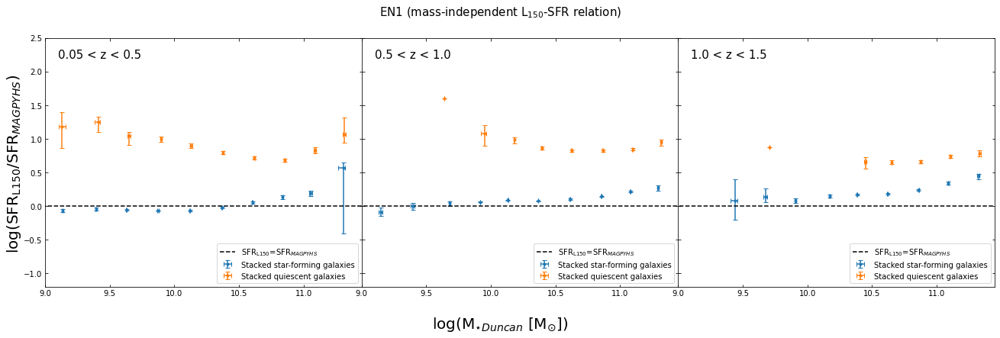

In [86]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio']),
                   xerr=[data['Mass_median_2']-data['Mass_l'],
                         data['Mass_u']-data['Mass_median_2']],#label='Stacked star-forming galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_l']),
                         np.log10(data['SFR_ratio_u'])-np.log10(data['SFR_ratio'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio']),
                   xerr=[data['Mass_median_2']-data['Mass_l'],
                         data['Mass_u']-data['Mass_median_2']],#label='Stacked quiescent galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_l']),
                         np.log10(data['SFR_ratio_u'])-np.log10(data['SFR_ratio'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

In [58]:
grouped_4 = table.query(SF).groupby([create_bins(table.loc[:,'Z_BEST_1'],z_binwidth),create_bins(np.log10(table.loc[:,'Mstar_50']),mass_binwidth)])
stacked_SFG_magphys = grouped_4.median()[['Z_BEST_1','z','Mass_median_2','Mstar_50','SFR_50','pix_flux','L150','L150_pix','L150_noneg','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']]

stacked_SFG_magphys[['SFR_16','L150_16','Mass_16','SFR_L150_16','SFR_L150_16_M','SFR_ratio_16','SFR_ratio_16_M']] = grouped_4[
    ['SFR_50','L150_noneg','Mstar_50','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,16))
stacked_SFG_magphys[['SFR_84','L150_84','Mass_84','SFR_L150_84','SFR_L150_84_M','SFR_ratio_84','SFR_ratio_84_M']] = grouped_4[
    ['SFR_50','L150_noneg','Mstar_50','SFR_L150','SFR_L150_M','SFR_ratio','SFR_ratio_M']].agg(lambda x: np.percentile(x,84))

In [93]:
SFG_lb, SFG_ub = [lower_bound_V(grouped_4.size()),upper_bound_V(grouped_4.size())]
stacked_SFG_magphys['SFR_ratio_l'] = [grouped_4.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_4.groups.keys())]
stacked_SFG_magphys['SFR_ratio_u'] = [grouped_4.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_4.groups.keys())]
stacked_SFG_magphys['SFR_50_l'] = [grouped_4.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_4.groups.keys())]
stacked_SFG_magphys['SFR_50_u'] = [grouped_4.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_4.groups.keys())]
stacked_SFG_magphys['SFR_L150_l'] = [grouped_4.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_4.groups.keys())]
stacked_SFG_magphys['SFR_L150_u'] = [grouped_4.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_4.groups.keys())]
stacked_SFG_magphys['Mass_l'] = [grouped_4.get_group(name)['Mstar_50'].sort_values().iloc[index] for index, name in zip(SFG_lb,grouped_4.groups.keys())]
stacked_SFG_magphys['Mass_u'] = [grouped_4.get_group(name)['Mstar_50'].sort_values().iloc[index] for index, name in zip(SFG_ub,grouped_4.groups.keys())]

In [94]:
QG_lb, QG_ub = [lower_bound_V(grouped_5.size()),upper_bound_V(grouped_5.size())]
stacked_QG_magphys['SFR_ratio_l'] = [grouped_5.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_5.groups.keys())]
stacked_QG_magphys['SFR_ratio_u'] = [grouped_5.get_group(name)['SFR_ratio'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_5.groups.keys())]
stacked_QG_magphys['SFR_50_l'] = [grouped_5.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_5.groups.keys())]
stacked_QG_magphys['SFR_50_u'] = [grouped_5.get_group(name)['SFR_50'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_5.groups.keys())]
stacked_QG_magphys['SFR_L150_l'] = [grouped_5.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_5.groups.keys())]
stacked_QG_magphys['SFR_L150_u'] = [grouped_5.get_group(name)['SFR_L150'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_5.groups.keys())]
stacked_QG_magphys['Mass_l'] = [grouped_5.get_group(name)['Mstar_50'].sort_values().iloc[index] for index, name in zip(QG_lb,grouped_5.groups.keys())]
stacked_QG_magphys['Mass_u'] = [grouped_5.get_group(name)['Mstar_50'].sort_values().iloc[index] for index, name in zip(QG_ub,grouped_5.groups.keys())]

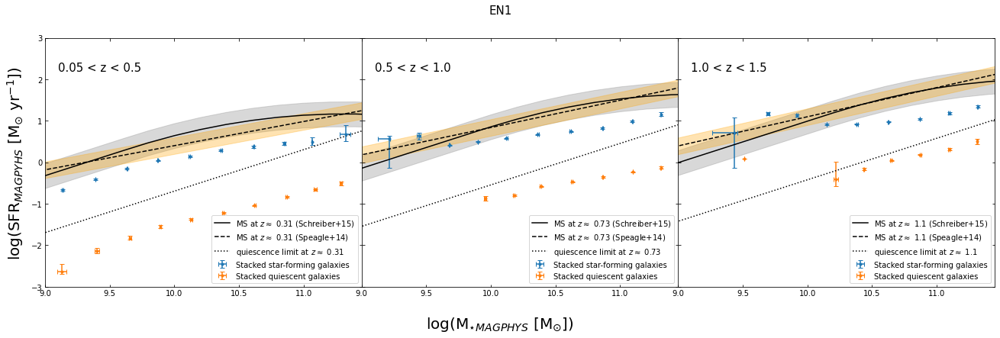

In [97]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_50']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_l']),
                         np.log10(data['Mass_u'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_50_l']),
                         np.log10(data['SFR_50_u'])-np.log10(data['SFR_50'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_50']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_l']),
                         np.log10(data['Mass_u'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_50_l']),
                         np.log10(data['SFR_50_u'])-np.log10(data['SFR_50'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

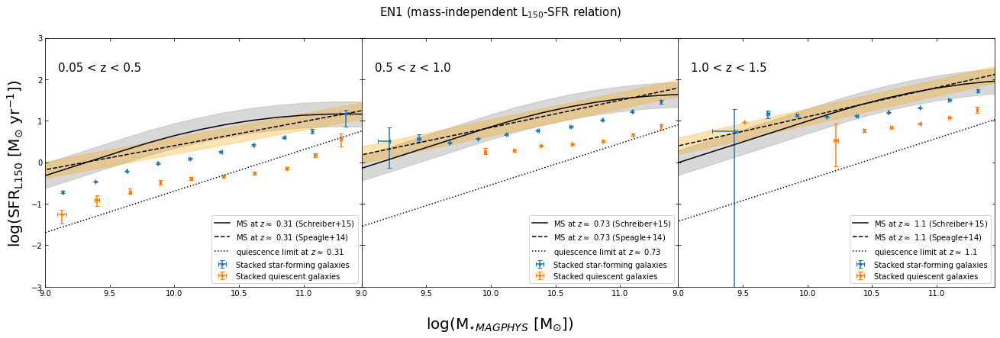

In [95]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_l']),
                         np.log10(data['Mass_u'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_l']),
                         np.log10(data['SFR_L150_u'])-np.log10(data['SFR_L150'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_L150']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_l']),
                         np.log10(data['Mass_u'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_l']),
                         np.log10(data['SFR_L150_u'])-np.log10(data['SFR_L150'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

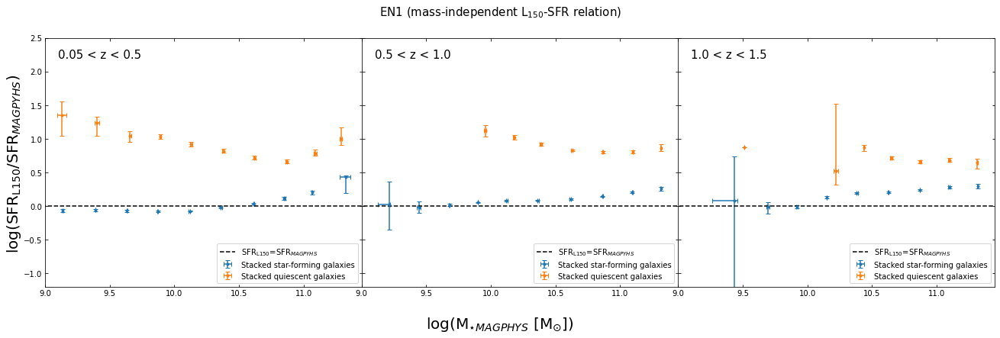

In [96]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG_magphys[(stacked_SFG_magphys['Z_BEST_1']>z1)&(stacked_SFG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_ratio']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_l']),
                         np.log10(data['Mass_u'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_l']),
                         np.log10(data['SFR_ratio_u'])-np.log10(data['SFR_ratio'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG_magphys[(stacked_QG_magphys['Z_BEST_1']>z1)&(stacked_QG_magphys['Z_BEST_1']<=z2)]
    ax[i].errorbar(np.log10(data['Mstar_50']),np.log10(data['SFR_ratio']),
                   xerr=[np.log10(data['Mstar_50'])-np.log10(data['Mass_l']),
                         np.log10(data['Mass_u'])-np.log10(data['Mstar_50'])],
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_l']),
                         np.log10(data['SFR_ratio_u'])-np.log10(data['SFR_ratio'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star MAGPHYS}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

In [23]:
indices = np.arange(len(arr))[(arr >= 0.16)&(arr <= 0.84)][[0,-1]]

indices = np.arange(len(arr))[(arr >= 0.025)&(arr <= 0.975)][[0,-1]]

bounds = [ (table['Mass_median_2'].sort_values()).iloc[indices[0]],(table['Mass_median_2'].sort_values()).iloc[indices[1]] ]

table['Mass_median_2'].sort_values()[(arr >= 0.025)&(arr <= 0.975)].iloc[[0,-1]].to_list()

median_bounds(table['Mass_median_2'])

median_bounds(pd.Series(np.arange(1,101)))

bounds

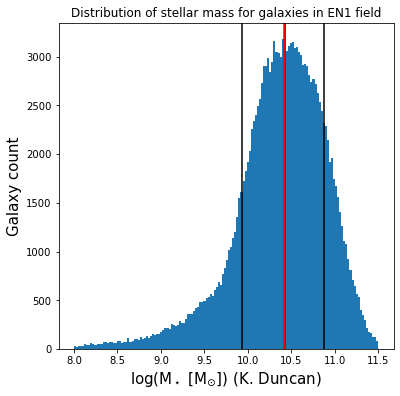

In [53]:
fig, ax = plt.subplots(figsize=(6,6))
# Plotting stellar mass histogram
ax.set_title('Distribution of stellar mass for galaxies in '+field+' field')
ax.set_xlabel('log(M$_\star$ [M$_{\odot}$]) (K. Duncan)',size=15)
ax.set_ylabel('Galaxy count',size=15)
ax.hist(table['Mass_median_2'], 'auto')
ax.axvline(table['Mass_median_2'].median(),c='k')
ax.axvline(np.percentile(table['Mass_median_2'],16),c='k')
ax.axvline(np.percentile(table['Mass_median_2'],84),c='k')
ax.axvline(bounds[0],c='r')
ax.axvline(bounds[1],c='r')
plt.show()

In [47]:
stacked['SFR_16'] = grouped_1['SFR_50'].agg(lambda x: np.percentile(x,16))
stacked['SFR_84'] = grouped_1['SFR_50'].agg(lambda x: np.percentile(x,84))
stacked['L150_16'] = grouped_1['L150_noneg'].agg(lambda x: np.percentile(x,16))
stacked['L150_84'] = grouped_1['L150_noneg'].agg(lambda x: np.percentile(x,84))
stacked['Mass_16'] = grouped_1['Mass_median_2'].agg(lambda x: np.percentile(x,16))
stacked['Mass_84'] = grouped_1['Mass_median_2'].agg(lambda x: np.percentile(x,84))
stacked['SFR_L150_16'] = grouped_1['SFR_L150'].agg(lambda x: np.percentile(x,16))
stacked['SFR_L150_84'] = grouped_1['SFR_L150'].agg(lambda x: np.percentile(x,84))
stacked['SFR_ratio_16'] = grouped_1['SFR_ratio'].agg(lambda x: np.percentile(x,16))
stacked['SFR_ratio_84'] = grouped_1['SFR_ratio'].agg(lambda x: np.percentile(x,84))

## Excluding sources detected at 150 MHz

In [95]:
table = table[~np.isfinite(table['Peak_flux'])]

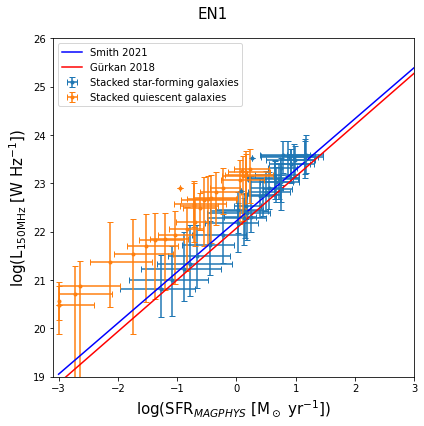

In [100]:
fig, ax = plt.subplots(figsize=(6,6),sharex='row',sharey='row')
ax.errorbar(np.log10(stacked_SFG['SFR_50']),np.log10(stacked_SFG['L150_noneg']),
               xerr=[np.log10(stacked_SFG['SFR_50'])-np.log10(stacked_SFG['SFR_16']),
                     np.log10(stacked_SFG['SFR_84'])-np.log10(stacked_SFG['SFR_50'])],
               yerr=[np.log10(stacked_SFG['L150_noneg'])-np.log10(stacked_SFG['L150_16']),
                     np.log10(stacked_SFG['L150_84'])-np.log10(stacked_SFG['L150_noneg'])],
               label='Stacked star-forming galaxies',fmt='.',capsize=3.)

ax.errorbar(np.log10(stacked_QG['SFR_50']),np.log10(stacked_QG['L150_noneg']),
               xerr=[np.log10(stacked_QG['SFR_50'])-np.log10(stacked_QG['SFR_16']),
                     np.log10(stacked_QG['SFR_84'])-np.log10(stacked_QG['SFR_50'])],
               yerr=[np.log10(stacked_QG['L150_noneg'])-np.log10(stacked_QG['L150_16']),
                     np.log10(stacked_QG['L150_84'])-np.log10(stacked_QG['L150_noneg'])],
               label='Stacked quiescent galaxies',fmt='.',capsize=3.)
ax.set_xlabel('log(SFR$_{MAGPHYS}$ [M$_\odot$ yr$^{-1}$])',size=15)
ax.set_ylabel('log(L$_{150\mathrm{ MHz}}$ [W Hz$^{-1}$])',size=15)
ax.plot(np.arange(-3,4,1),1.058*np.arange(-3,4,1) + 22.221,c='b',label='Smith 2021')
ax.plot(np.arange(-3,4,1),1.07*np.arange(-3,4,1) + 22.07,c='r',label='Gürkan 2018')
ax.set_xlim(-3.1,3)
ax.set_ylim(19,26)
ax.legend()
fig.suptitle(field, size=15)
fig.tight_layout()
plt.show()

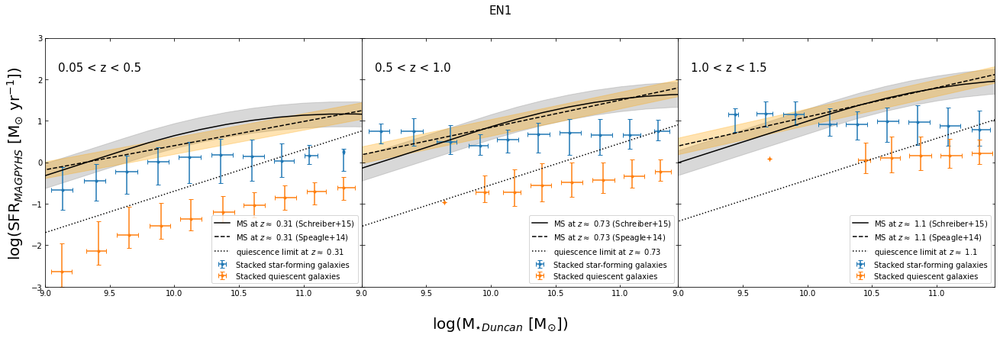

In [101]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_50'])-np.log10(data['SFR_16']),
                         np.log10(data['SFR_84'])-np.log10(data['SFR_50'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{MAGPYHS}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field, size=15)
plt.show()

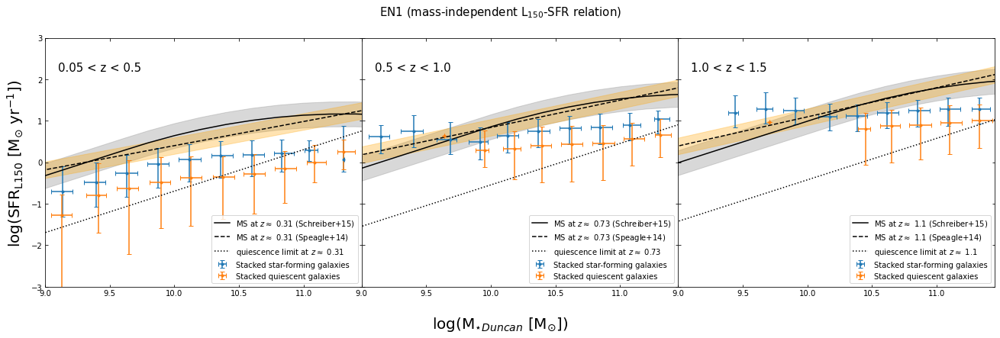

In [102]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    z_median = table.loc[(table['Z_BEST_1']>z1)&(table['Z_BEST_1']<=z2),'Z_BEST_1'].median()
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_L150']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_L150'])-np.log10(data['SFR_L150_16']),
                         np.log10(data['SFR_L150_84'])-np.log10(data['SFR_L150'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z_median),ls='-', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z_median)-0.3,SchreiberMS(m,z_median)+0.3,alpha=0.3,color='grey')
    ax[i].plot(m,SpeagleMS(m,z_median),ls='--', c='k', label=fr'MS at $z \approx$ {z_median:.2} (Speagle+14)')
    ax[i].fill_between(m,SpeagleMS(m,z_median)-0.2,SpeagleMS(m,z_median)+0.2,alpha=0.3,color='orange')
    ax[i].plot(m,CarnallQ(m,z_median),ls=':', c='k', label=fr'quiescence limit at $z \approx$ {z_median:.2}')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

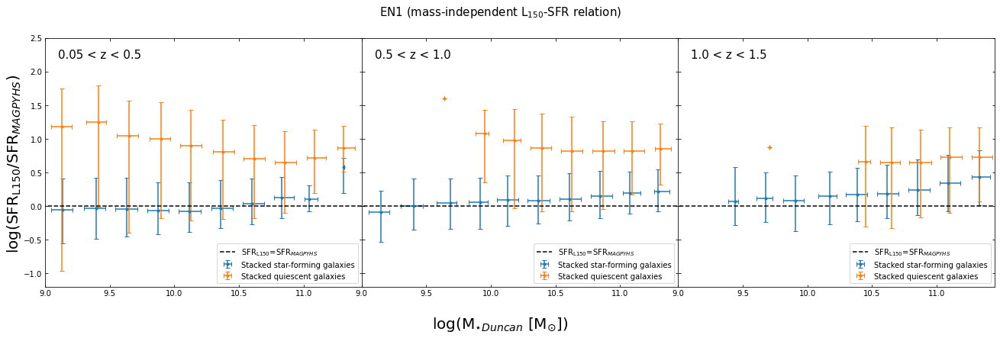

In [103]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],#label='Stacked star-forming galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_16']),
                         np.log10(data['SFR_ratio_84'])-np.log10(data['SFR_ratio'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_ratio']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],#label='Stacked quiescent galaxies',fmt='.',capsize=3.)
                   yerr=[np.log10(data['SFR_ratio'])-np.log10(data['SFR_ratio_16']),
                         np.log10(data['SFR_ratio_84'])-np.log10(data['SFR_ratio'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot([6,12],[0,0],ls='--', c='k', label='SFR$_{\mathrm{L}150}$=SFR$_{MAGPYHS}$')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-1.2,2.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{\mathrm{L}150}$/SFR$_{MAGPYHS}$)", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

## Obtaining L150 median value by stacking distributions of L150 from all sources

In [70]:
def stack_dist(mu,sigma):
    a = np.random.default_rng().normal(mu,sigma, 100)
    #print(a)
    s.append(a)
    
    return None
stack_dist_v = np.vectorize(stack_dist)

In [72]:
for group in grouped_2.groups.keys():
    s = []
    #print(len(s))
    sample = grouped_2.get_group(group)
    #print(len(sample))
    for source in sample.index:
        #print(source)
        stack_dist(sample.loc[source,'L150_pix'],sample.loc[source,'L150_pix_unc'])
    s_noneg = np.array(s).flatten()
    #print(len(s_noneg))
    s_noneg[s_noneg<10**17] = 10**17
    stacked_SFG.loc[group,['L150_dist16','L150_dist50','L150_dist84']] = np.percentile(s_noneg,16), np.percentile(s_noneg,50), np.percentile(s_noneg,84)
    #print(group)

In [73]:
for group in grouped_3.groups.keys():
    s = []
    #print(len(s))
    sample = grouped_3.get_group(group)
    #print(len(sample))
    for source in sample.index:
        #print(source)
        stack_dist(sample.loc[source,'L150_pix'],sample.loc[source,'L150_pix_unc'])
    s_noneg = np.array(s).flatten()
    #print(len(s_noneg))
    s_noneg[s_noneg<10**17] = 10**17
    stacked_QG.loc[group,['L150_dist16','L150_dist50','L150_dist84']] = np.percentile(s_noneg,16), np.percentile(s_noneg,50), np.percentile(s_noneg,84)
    #print(group)

In [74]:
stacked_SFG['SFR_dist16'], stacked_SFG['SFR_dist16_M'] = SFR_smith_v(stacked_SFG['L150_dist16'],stacked_SFG['Mass_median_2'])
stacked_SFG['SFR_dist50'], stacked_SFG['SFR_dist50_M'] = SFR_smith_v(stacked_SFG['L150_dist50'],stacked_SFG['Mass_median_2'])
stacked_SFG['SFR_dist84'], stacked_SFG['SFR_dist84_M'] = SFR_smith_v(stacked_SFG['L150_dist84'],stacked_SFG['Mass_median_2'])

In [75]:
stacked_QG['SFR_dist16'], stacked_QG['SFR_dist16_M'] = SFR_smith_v(stacked_QG['L150_dist16'],stacked_QG['Mass_median_2'])
stacked_QG['SFR_dist50'], stacked_QG['SFR_dist50_M'] = SFR_smith_v(stacked_QG['L150_dist50'],stacked_QG['Mass_median_2'])
stacked_QG['SFR_dist84'], stacked_QG['SFR_dist84_M'] = SFR_smith_v(stacked_QG['L150_dist84'],stacked_QG['Mass_median_2'])

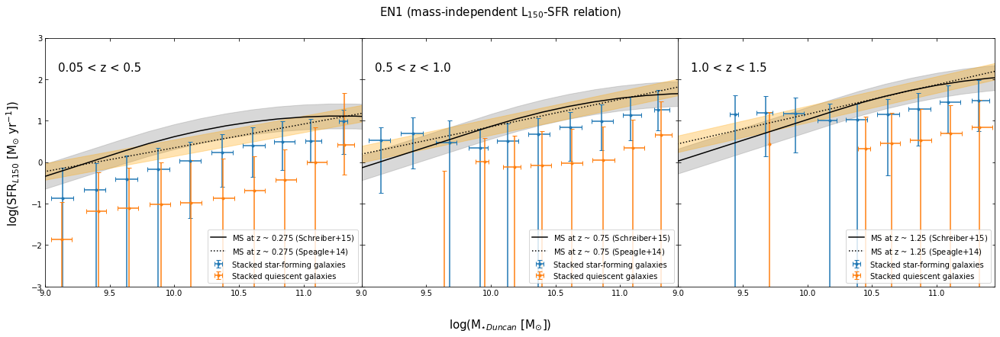

In [76]:
fig, ax = plt.subplots(1,3,figsize=(18,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.05,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = stacked_SFG[(stacked_SFG['Z_BEST_1']>z1)&(stacked_SFG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_dist50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_dist50'])-np.log10(data['SFR_dist16']),
                         np.log10(data['SFR_dist84'])-np.log10(data['SFR_dist50'])],label='Stacked star-forming galaxies',fmt='.',capsize=3.)
    
    data = stacked_QG[(stacked_QG['Z_BEST_1']>z1)&(stacked_QG['Z_BEST_1']<=z2)]
    ax[i].errorbar(data['Mass_median_2'],np.log10(data['SFR_dist50']),
                   xerr=[data['Mass_median_2']-data['Mass_16'],
                         data['Mass_84']-data['Mass_median_2']],
                   yerr=[np.log10(data['SFR_dist50'])-np.log10(data['SFR_dist16']),
                         np.log10(data['SFR_dist84'])-np.log10(data['SFR_dist50'])],label='Stacked quiescent galaxies',fmt='.',capsize=3.)
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].plot(m,SpeagleMS(m,z),ls=':', c='k', label=f'MS at z ~ ${z}$ (Speagle+14)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].fill_between(m,SpeagleMS(m,z)-0.2,SpeagleMS(m,z)+0.2,alpha=0.3,color='orange')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.45)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='lower right')
fig.text(0.5, 0.0,"log(M$_{\star Duncan}$ [M$_{\odot}$])", ha='center',fontsize=15)
fig.text(0.0, 0.5,"log(SFR$_{L150}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=15, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
fig.suptitle(field+' (mass-independent L$_{150}$-SFR relation)', size=15)
plt.show()

# NOTEBOOK ENDS HERE